In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.formula.api as smf
import warnings
import openpyxl 
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
pd.set_option('display.precision', 2) 

In [3]:
#read of dataphram and overview of data
df = pd.read_csv('../../data/raw/diabetes_dataset.csv')
def overview(df):
    '''
    Erstelle einen Überblick über einige Eigenschaften der Spalten eines DataFrames.
    VARs
        df: Der zu betrachtende DataFrame
    RETURNS:
        overview: Überblick über einige Eigenschaften der Spalten eines DataFrames.
    '''
    overview=display(pd.DataFrame({'dtype': df.dtypes,
                          'total': df.count(),
                          'missing values(n)': df.isna().sum(),
                          'missing values(%)': df.isna().mean()*100,
                          'number of uniques': df.nunique(),
                          'uniques': [df[col].unique() for col in df.columns]
                         }))
    return overview
    
overview(df)

,dtype,total,missing values(n),missing values(%),number of uniques,uniques
age,int64,100000,0,0.0,73,"[58, 48, 60, 74, 46, 75, 62, 42, 59, 43, 54, 1..."
gender,object,100000,0,0.0,3,"[Male, Female, Other]"
ethnicity,object,100000,0,0.0,5,"[Asian, White, Hispanic, Black, Other]"
education_level,object,100000,0,0.0,4,"[Highschool, Graduate, Postgraduate, No formal]"
income_level,object,100000,0,0.0,5,"[Lower-Middle, Middle, Low, Upper-Middle, High]"
employment_status,object,100000,0,0.0,4,"[Employed, Unemployed, Retired, Student]"
smoking_status,object,100000,0,0.0,3,"[Never, Former, Current]"
alcohol_consumption_per_week,int64,100000,0,0.0,11,"[0, 1, 2, 3, 6, 5, 4, 9, 8, 7, 10]"
physical_activity_minutes_per_week,int64,100000,0,0.0,620,"[215, 143, 57, 49, 109, 124, 53, 75, 114, 86, ..."
diet_score,float64,100000,0,0.0,101,"[5.7, 6.7, 6.4, 3.4, 7.2, 9.0, 9.2, 4.1, 8.2, ..."


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 31 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   age                                 100000 non-null  int64  
 1   gender                              100000 non-null  object 
 2   ethnicity                           100000 non-null  object 
 3   education_level                     100000 non-null  object 
 4   income_level                        100000 non-null  object 
 5   employment_status                   100000 non-null  object 
 6   smoking_status                      100000 non-null  object 
 7   alcohol_consumption_per_week        100000 non-null  int64  
 8   physical_activity_minutes_per_week  100000 non-null  int64  
 9   diet_score                          100000 non-null  float64
 10  sleep_hours_per_day                 100000 non-null  float64
 11  screen_time_hours_per_day  

,age,gender,ethnicity,education_level,income_level,employment_status,smoking_status,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,...,hdl_cholesterol,ldl_cholesterol,triglycerides,glucose_fasting,glucose_postprandial,insulin_level,hba1c,diabetes_risk_score,diabetes_stage,diagnosed_diabetes
0,58,Male,Asian,Highschool,Lower-Middle,Employed,Never,0,215,5.7,...,41,160,145,136,236,6.36,8.18,29.6,Type 2,1
1,48,Female,White,Highschool,Middle,Employed,Former,1,143,6.7,...,55,50,30,93,150,2.00,5.63,23.0,No Diabetes,0
2,60,Male,Hispanic,Highschool,Middle,Unemployed,Never,1,57,6.4,...,66,99,36,118,195,5.07,7.51,44.7,Type 2,1
3,74,Female,Black,Highschool,Low,Retired,Never,0,49,3.4,...,50,79,140,139,253,5.28,9.03,38.2,Type 2,1
4,46,Male,White,Graduate,Middle,Retired,Never,1,109,7.2,...,52,125,160,137,184,12.74,7.20,23.5,Type 2,1


missing values


age                                   0
gender                                0
ethnicity                             0
education_level                       0
income_level                          0
employment_status                     0
smoking_status                        0
alcohol_consumption_per_week          0
physical_activity_minutes_per_week    0
diet_score                            0
sleep_hours_per_day                   0
screen_time_hours_per_day             0
family_history_diabetes               0
hypertension_history                  0
cardiovascular_history                0
bmi                                   0
waist_to_hip_ratio                    0
systolic_bp                           0
diastolic_bp                          0
heart_rate                            0
cholesterol_total                     0
hdl_cholesterol                       0
ldl_cholesterol                       0
triglycerides                         0
glucose_fasting        

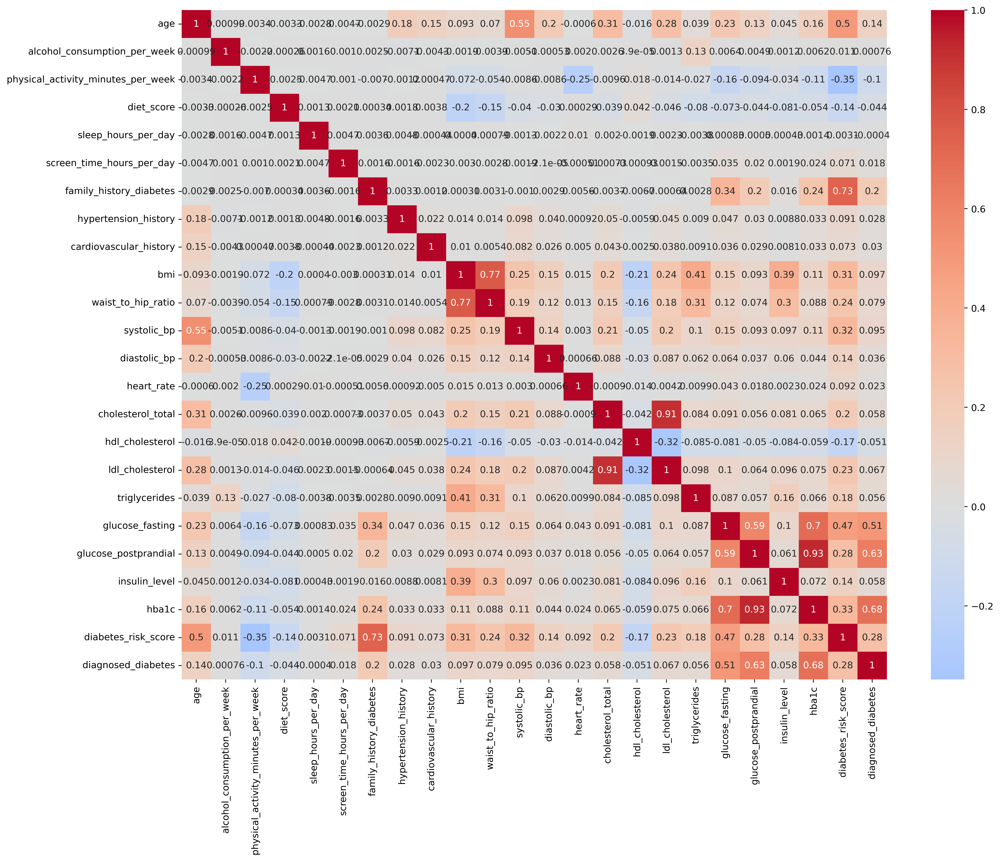

In [4]:
print(df.info())
display(df.head())
print('missing values')
print('\n')
print(df.isna().sum())
fig, ax = plt.subplots(figsize=(17, 13), dpi=400)
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap="coolwarm", center=0, ax=ax);
plt.tight_layout;

In [5]:
#change object columns to category columns
display(df.dtypes)
object_columns = df.select_dtypes(include=['object']).columns.tolist()
for column in object_columns:
    df[column]=df[column].astype('category')
print('Change to category columns from object columns')

df.dtypes


age                                     int64
gender                                 object
ethnicity                              object
education_level                        object
income_level                           object
employment_status                      object
smoking_status                         object
alcohol_consumption_per_week            int64
physical_activity_minutes_per_week      int64
diet_score                            float64
sleep_hours_per_day                   float64
screen_time_hours_per_day             float64
family_history_diabetes                 int64
hypertension_history                    int64
cardiovascular_history                  int64
bmi                                   float64
waist_to_hip_ratio                    float64
systolic_bp                             int64
diastolic_bp                            int64
heart_rate                              int64
cholesterol_total                       int64
hdl_cholesterol                   

Change to category columns from object columns


age                                      int64
gender                                category
ethnicity                             category
education_level                       category
income_level                          category
employment_status                     category
smoking_status                        category
alcohol_consumption_per_week             int64
physical_activity_minutes_per_week       int64
diet_score                             float64
sleep_hours_per_day                    float64
screen_time_hours_per_day              float64
family_history_diabetes                  int64
hypertension_history                     int64
cardiovascular_history                   int64
bmi                                    float64
waist_to_hip_ratio                     float64
systolic_bp                              int64
diastolic_bp                             int64
heart_rate                               int64
cholesterol_total                        int64
hdl_cholester

In [6]:
print('unique vlues fÜr gender:', df['gender'].unique())
print('unique vlues fÜr ethnicity:', df['ethnicity'].unique())
print('unique vlues fÜr education_level:', df['education_level'].unique())
print('unique vlues fÜr income_level:', df['income_level'].unique())
print('unique vlues fÜr employment_status:', df['employment_status'].unique())
print('unique vlues fÜr smoking_status:', df['smoking_status'].unique())
print('unique vlues fÜr diabetes_stage:', df['diabetes_stage'].unique())

unique vlues fÜr gender: ['Male', 'Female', 'Other']
Categories (3, object): ['Female', 'Male', 'Other']
unique vlues fÜr ethnicity: ['Asian', 'White', 'Hispanic', 'Black', 'Other']
Categories (5, object): ['Asian', 'Black', 'Hispanic', 'Other', 'White']
unique vlues fÜr education_level: ['Highschool', 'Graduate', 'Postgraduate', 'No formal']
Categories (4, object): ['Graduate', 'Highschool', 'No formal', 'Postgraduate']
unique vlues fÜr income_level: ['Lower-Middle', 'Middle', 'Low', 'Upper-Middle', 'High']
Categories (5, object): ['High', 'Low', 'Lower-Middle', 'Middle', 'Upper-Middle']
unique vlues fÜr employment_status: ['Employed', 'Unemployed', 'Retired', 'Student']
Categories (4, object): ['Employed', 'Retired', 'Student', 'Unemployed']
unique vlues fÜr smoking_status: ['Never', 'Former', 'Current']
Categories (3, object): ['Current', 'Former', 'Never']
unique vlues fÜr diabetes_stage: ['Type 2', 'No Diabetes', 'Pre-Diabetes', 'Gestational', 'Type 1']
Categories (5, object): ['G

In [7]:
df.describe()    

,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,family_history_diabetes,hypertension_history,cardiovascular_history,bmi,...,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,glucose_fasting,glucose_postprandial,insulin_level,hba1c,diabetes_risk_score,diagnosed_diabetes
count,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,...,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00
mean,50.12,2.00,118.91,5.99,7.00,6.00,0.22,0.25,0.08,25.61,...,185.98,54.04,103.00,121.46,111.12,160.04,9.06,6.52,30.22,0.60
std,15.60,1.42,84.41,1.78,1.09,2.47,0.41,0.43,0.27,3.59,...,32.01,10.27,33.39,43.37,13.60,30.94,4.95,0.81,9.06,0.49
min,18.00,0.00,0.00,0.00,3.00,0.50,0.00,0.00,0.00,15.00,...,100.00,20.00,50.00,30.00,60.00,70.00,2.00,4.00,2.70,0.00
25%,39.00,1.00,57.00,4.80,6.30,4.30,0.00,0.00,0.00,23.20,...,164.00,47.00,78.00,91.00,102.00,139.00,5.09,5.97,23.80,0.00
50%,50.00,2.00,100.00,6.00,7.00,6.00,0.00,0.00,0.00,25.60,...,186.00,54.00,102.00,121.00,111.00,160.00,8.79,6.52,29.00,1.00
75%,61.00,3.00,160.00,7.20,7.70,7.70,0.00,1.00,0.00,28.00,...,208.00,61.00,126.00,151.00,120.00,181.00,12.45,7.07,35.60,1.00
max,90.00,10.00,833.00,10.00,10.00,16.80,1.00,1.00,1.00,39.20,...,318.00,98.00,263.00,344.00,172.00,287.00,32.22,9.80,67.20,1.00


In [8]:
df.duplicated().sum()

np.int64(0)

1- Search of count and percentage of each class in diabetes_stage column in this dataset

Number of people in each class in diabetes_stage column


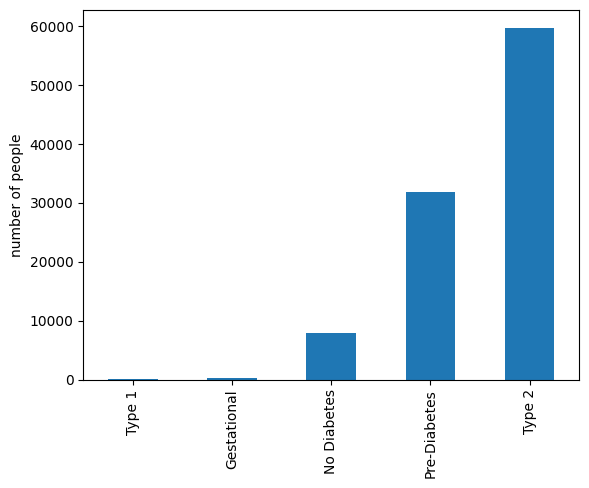

Number of people in each class in diabetes_stage column in percent


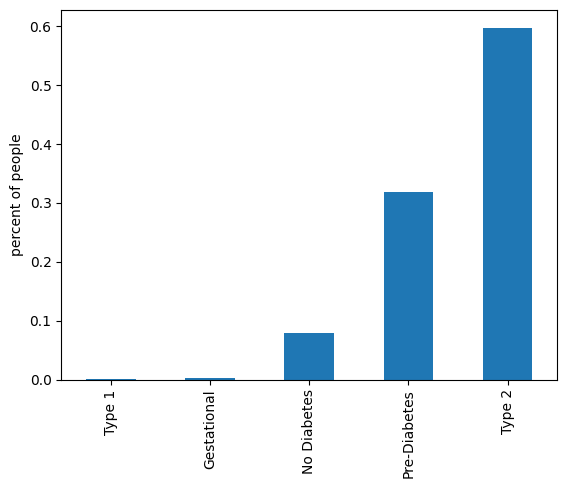

In [9]:
#Number of people in each class in diabetes_stage column
print('Number of people in each class in diabetes_stage column')
df_diabetes_ccount = pd.crosstab(index=df['diabetes_stage'], columns='count').sort_values(by='count').plot(kind='bar', legend=False);
plt.ylabel('number of people')
plt.ylabel('number of people');
plt.xlabel(None);
plt.show()

print('Number of people in each class in diabetes_stage column in percent')
df_diabets_ccount_normalized = pd.crosstab(index=df['diabetes_stage'], columns='count', normalize='columns').sort_values(by='count').plot(kind='bar', legend=False);
plt.ylabel('percent of people');
plt.xlabel(None);

2- Search of total count and percentage of diabetic und not diabetic people in this dataset

counts of diabetics und non-diabetics diagnosed in this dataset


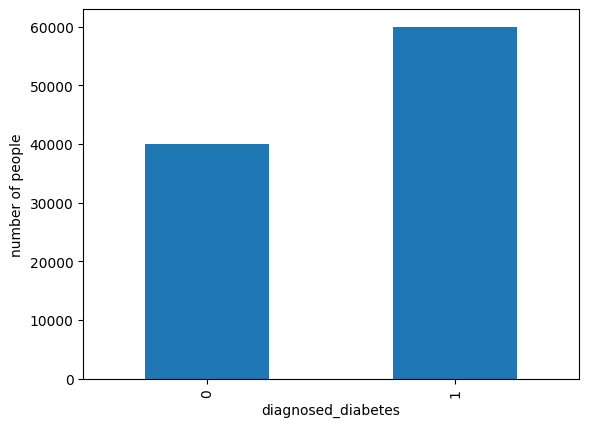

percent of diabetics und non-diabetics diagnosed in this dataset


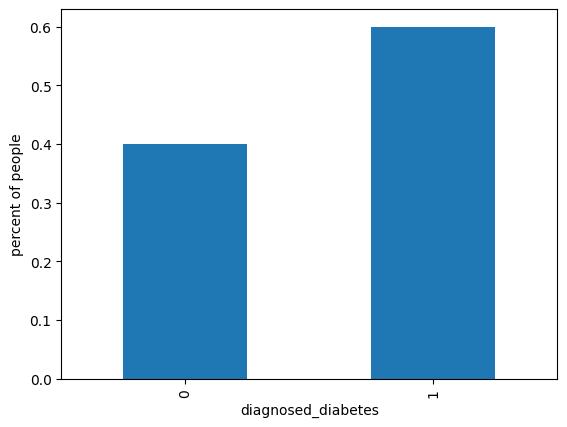

In [10]:
print('counts of diabetics und non-diabetics diagnosed in this dataset')
df_diabetes_ccount = pd.crosstab(index=df['diagnosed_diabetes'], columns='count').plot(kind='bar', legend=False);
plt.ylabel('number of people');
plt.show()

print('percent of diabetics und non-diabetics diagnosed in this dataset')
df_diabets_ccount_normalized = pd.crosstab(index=df['diagnosed_diabetes'], columns='count', normalize='columns').plot(kind='bar', legend=False);
plt.ylabel('percent of people');

3- search of varaibles(diabetes_stag, diagnosed_diabetes) by category-columns

The number of each class of gender in this dataset


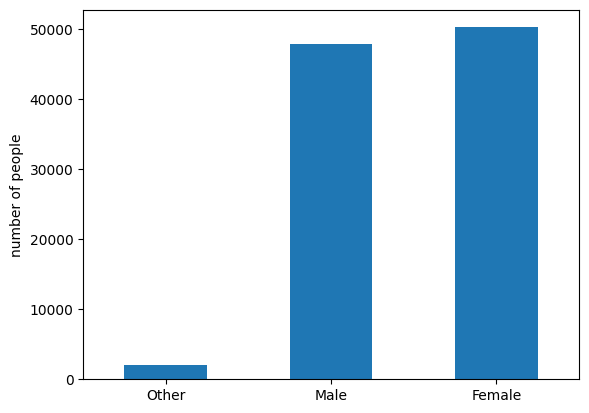

The percentage of each class of gender in this dataset


(array([0, 1, 2]),
 [Text(0, 0, 'Other'), Text(1, 0, 'Male'), Text(2, 0, 'Female')])

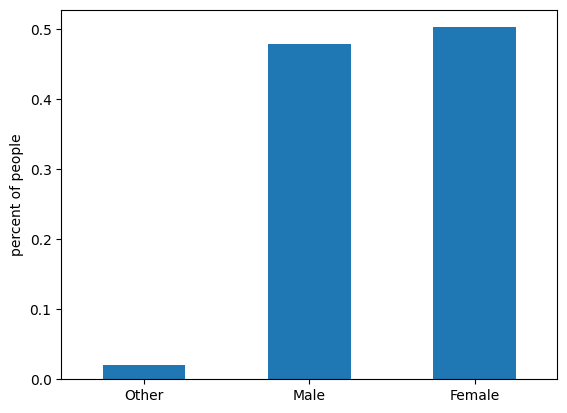

In [11]:
#The number of each class of gender in this dataset



print('The number of each class of gender in this dataset')
df_gender_counts = pd.crosstab(index=df['gender'], columns='count').sort_values(by='count').plot(kind='bar', legend=False);
plt.ylabel('number of people');
plt.xlabel(None)
plt.xticks(rotation=0)
plt.show()
print('The percentage of each class of gender in this dataset')
df_gender_counts_normalized = pd.crosstab(index=df['gender'], columns='count', normalize='columns').sort_values(by='count').plot(kind='bar', legend=False);
plt.ylabel('percent of people');
plt.xlabel(None)
plt.xticks(rotation=0)

The grupuping of diabetes_stage classen with gender


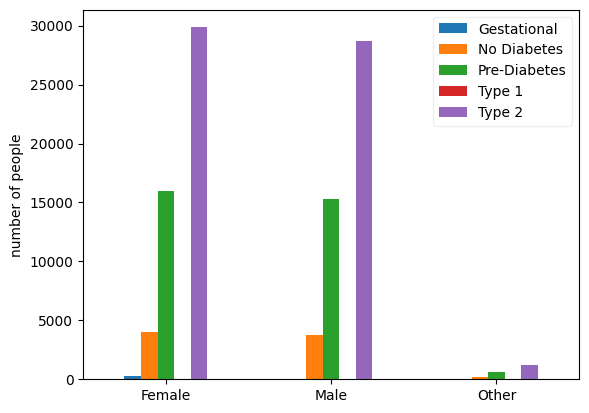

The grupuping of diabetes_stage classen with gender by normalizing of diabetes_stages classes


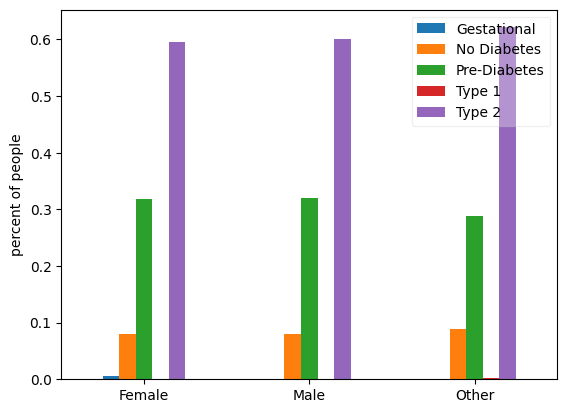

In [12]:
#The grupuping of diabetes_stage classen with gender
print('The grupuping of diabetes_stage classen with gender')
data_diabetes_gender = pd.crosstab(index=df['gender'], columns=df['diabetes_stage'])
data_diabetes_gender.plot(kind='bar', legend=True);
plt.legend(framealpha=0.3)
plt.ylabel('number of people');
plt.xlabel(None);
plt.xticks(rotation=0);
plt.show()
print('The grupuping of diabetes_stage classen with gender by normalizing of diabetes_stages classes')
data_diabetes_gender_normalized = pd.crosstab(index=df['gender'], columns=df['diabetes_stage'], normalize='index')
data_diabetes_gender_normalized.plot(kind='bar', legend=True);
plt.legend(framealpha=0.3, loc='upper right')
plt.ylabel('percent of people');
plt.xlabel(None);
plt.xticks(rotation=0);

Type2 patients by gender


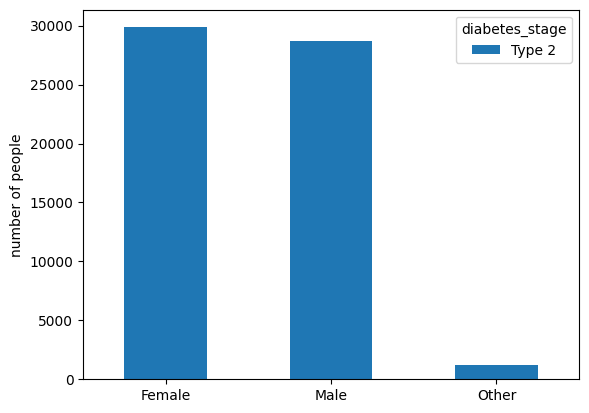

Type2 patients by gender in percent


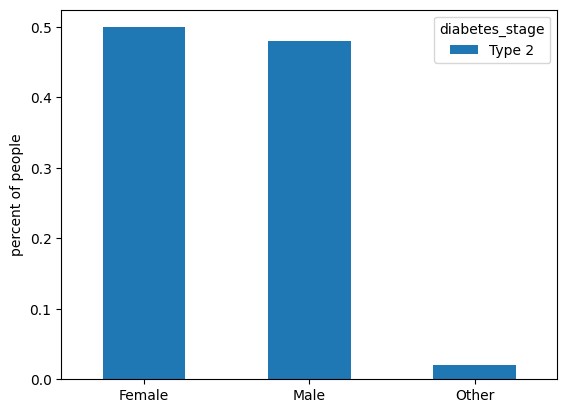

In [13]:
#searching of type2 patients by gender
print('Type2 patients by gender')
df_type2 = df[df['diabetes_stage'] == 'Type 2']
data_diabetes_type2_gender = pd.crosstab(index=df_type2['gender'], columns=df_type2['diabetes_stage'])
data_diabetes_type2_gender.plot(kind='bar');
plt.ylabel('number of people');
plt.xlabel(None);
plt.xticks(rotation=0);
plt.show()
print('Type2 patients by gender in percent')
data_diabetes_type2_gender_normalized = pd.crosstab(index=df_type2['gender'], columns=df_type2['diabetes_stage'], normalize='columns')
data_diabetes_type2_gender_normalized.plot(kind='bar');
plt.ylabel('percent of people');
plt.xlabel(None);
plt.xticks(rotation=0);

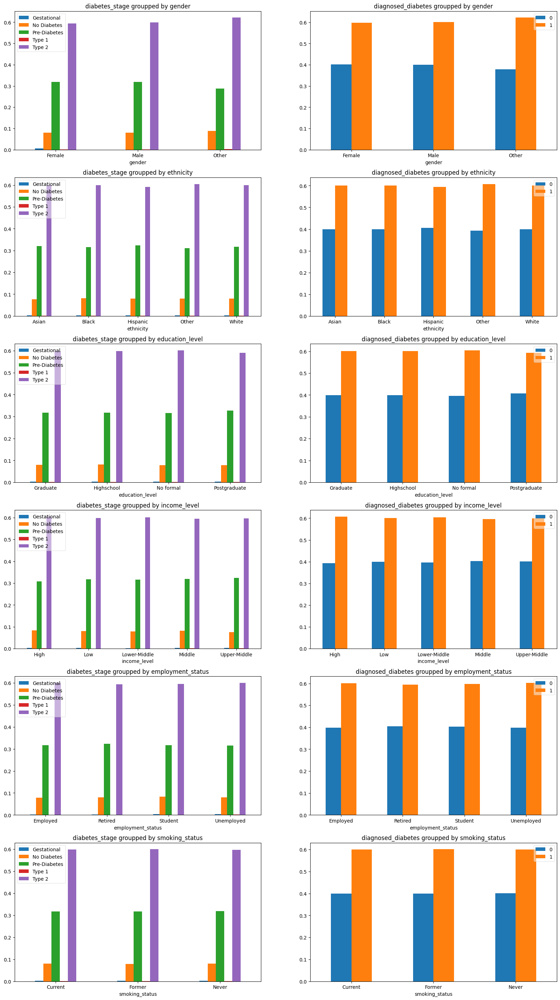

In [14]:
#search of category-columns
category_columns = df.select_dtypes(include=['category']).columns.tolist()
category_columns_without_diabetes_stage = [part for part in category_columns if part != 'diabetes_stage']
fig, ax = plt.subplots(nrows=len(category_columns_without_diabetes_stage), ncols=2, figsize=(20, 6*len(category_columns_without_diabetes_stage)))
for i, column in enumerate(category_columns_without_diabetes_stage):
    pd.crosstab(index=df[column], columns=df["diabetes_stage"], normalize="index").plot(kind="bar", ax=ax[i, 0], legend=True)
    pd.crosstab(index=df[column], columns=df["diagnosed_diabetes"], normalize="index").plot(kind="bar", ax=ax[i, 1], legend=True)
    ax[i, 0].set_title(f'diabetes_stage groupped by {column}')
    ax[i, 1].set_title(f'diagnosed_diabetes groupped by {column}')
    ax[i, 0].xaxis.set_tick_params(labelrotation=0)
    ax[i, 1].xaxis.set_tick_params(labelrotation=0)
    ax[i, 0].legend(loc = 'upper left', framealpha=0.5)
    ax[i, 1].legend(loc = 'upper right', framealpha=0.5)



plt.tight_layout;   

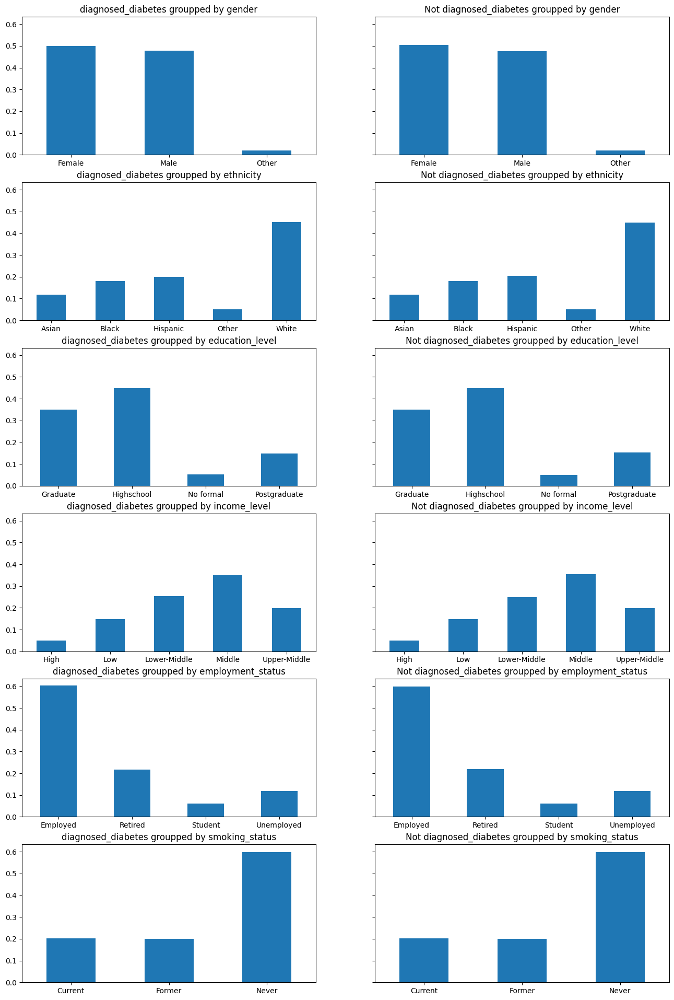

In [15]:
#search of diagnosed_diabetes column by category-columns
df_diabetes_diagnosed = df[df['diagnosed_diabetes'] == 1].copy()
df_not_diabetes_diagnosed = df[df['diagnosed_diabetes'] == 0].copy()

fig, ax = plt.subplots(nrows=len(category_columns_without_diabetes_stage), ncols=2, sharey=True, figsize=(16, 4*len(category_columns_without_diabetes_stage)))
for i, column in enumerate(category_columns_without_diabetes_stage):
    pd.crosstab(index=df_diabetes_diagnosed[column], columns=df_diabetes_diagnosed["diagnosed_diabetes"], normalize="columns").plot(kind="bar", ax=ax[i, 0], legend=False)
    pd.crosstab(index=df_not_diabetes_diagnosed[column], columns=df_not_diabetes_diagnosed["diagnosed_diabetes"], normalize="columns").plot(kind="bar", ax=ax[i, 1], legend=False)
    ax[i, 0].set_title(f'diagnosed_diabetes groupped by {column}')
    ax[i, 1].set_title(f'Not diagnosed_diabetes groupped by {column}')
    ax[i, 0].xaxis.set_tick_params(labelrotation=0)
    ax[i, 1].xaxis.set_tick_params(labelrotation=0)
    ax[i, 0].set_xlabel(None)
    ax[i, 1].set_xlabel(None)

plt.tight_layout;   

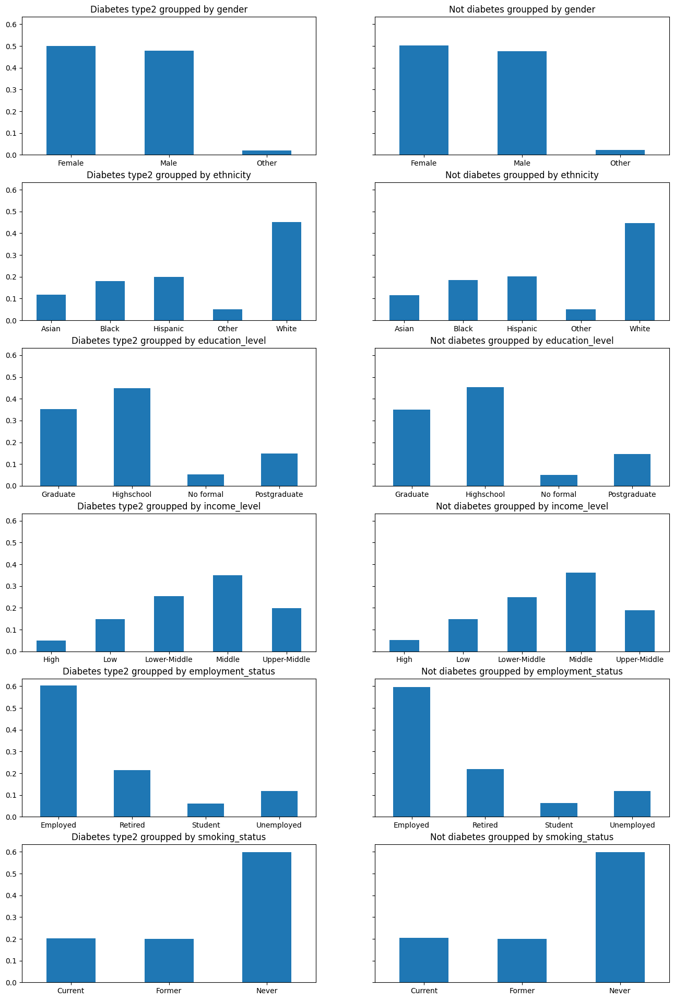

In [16]:
#search of diabetes type2 by category-columns
df_diabetes_stage_type2 = df[df['diabetes_stage'] == 'Type 2'].copy()
df_diabetes_stage_no = df[df['diabetes_stage'] == 'No Diabetes'].copy()

fig, ax = plt.subplots(nrows=len(category_columns_without_diabetes_stage), ncols=2, sharey=True, figsize=(16, 4*len(category_columns_without_diabetes_stage)))
for i, column in enumerate(category_columns_without_diabetes_stage):
    pd.crosstab(index=df_diabetes_stage_type2[column], columns=df_diabetes_stage_type2["diabetes_stage"], normalize="columns").plot(kind="bar", ax=ax[i, 0], legend=False)
    pd.crosstab(index=df_diabetes_stage_no[column], columns=df_diabetes_stage_no["diabetes_stage"], normalize="columns").plot(kind="bar", ax=ax[i, 1], legend=False)
    ax[i, 0].set_title(f'Diabetes type2 groupped by {column}')
    ax[i, 1].set_title(f'Not diabetes groupped by {column}')
    ax[i, 0].xaxis.set_tick_params(labelrotation=0)
    ax[i, 1].xaxis.set_tick_params(labelrotation=0)
    ax[i, 0].set_xlabel(None)
    ax[i, 1].set_xlabel(None)

plt.tight_layout;  

4- search of varaibles(diabetes_stag, diagnosed_diabetes) by numeric columns

In [17]:
#Recognition of numeric columns with low than 20 unique values
numeric_columns = ['age', 'alcohol_consumption_per_week', 'physical_activity_minutes_per_week', 'diet_score', 'sleep_hours_per_day',
'screen_time_hours_per_day', 'family_history_diabetes', 'hypertension_history', 'cardiovascular_history',
'bmi', 'waist_to_hip_ratio', 'systolic_bp', 'diastolic_bp', 'heart_rate', 'cholesterol_total', 'hdl_cholesterol',
'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'hba1c', 'diabetes_risk_score', 'glucose_postprandial', 'insulin_level']
numeric_categoric_columns = [col for col in numeric_columns if len(df[col].unique()) < 20]
numeric_numeric_columns = [col for col in numeric_columns if len(df[col].unique()) >= 20]
print('numeric_categoric_columns:', numeric_categoric_columns)
print('numeric_numeric_columns:', numeric_numeric_columns)    

numeric_categoric_columns: ['alcohol_consumption_per_week', 'family_history_diabetes', 'hypertension_history', 'cardiovascular_history']
numeric_numeric_columns: ['age', 'physical_activity_minutes_per_week', 'diet_score', 'sleep_hours_per_day', 'screen_time_hours_per_day', 'bmi', 'waist_to_hip_ratio', 'systolic_bp', 'diastolic_bp', 'heart_rate', 'cholesterol_total', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'hba1c', 'diabetes_risk_score', 'glucose_postprandial', 'insulin_level']


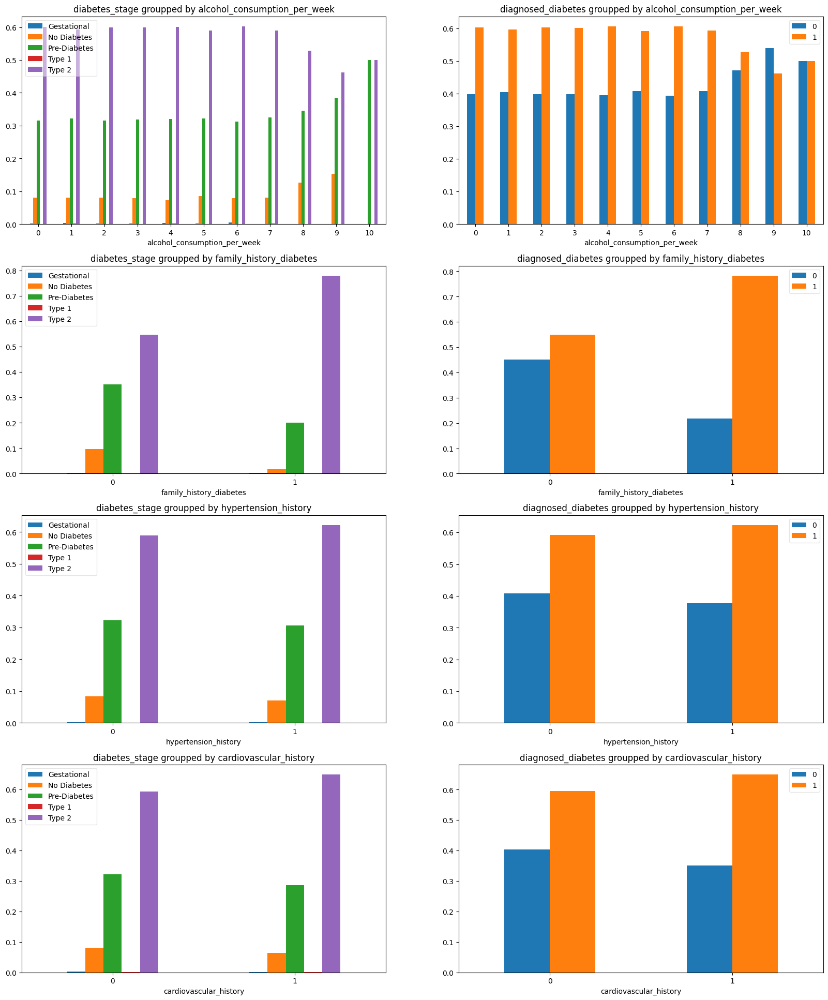

In [18]:
#search of numeric_categoric_columns
fig, ax = plt.subplots(nrows=len(numeric_categoric_columns), ncols=2, figsize=(20, 6*len(numeric_categoric_columns)))
for i, column in enumerate(numeric_categoric_columns):
    pd.crosstab(index=df[column], columns=df["diabetes_stage"], normalize="index").plot(kind="bar", ax=ax[i, 0], legend=True)
    pd.crosstab(index=df[column], columns=df["diagnosed_diabetes"], normalize="index").plot(kind="bar", ax=ax[i, 1], legend=True)
    ax[i, 0].set_title(f'diabetes_stage groupped by {column}')
    ax[i, 1].set_title(f'diagnosed_diabetes groupped by {column}')
    ax[i, 0].xaxis.set_tick_params(labelrotation=0)
    ax[i, 1].xaxis.set_tick_params(labelrotation=0)
    ax[i, 0].legend(framealpha=0.5)
    ax[i, 1].legend(framealpha=0.5)


plt.tight_layout;  

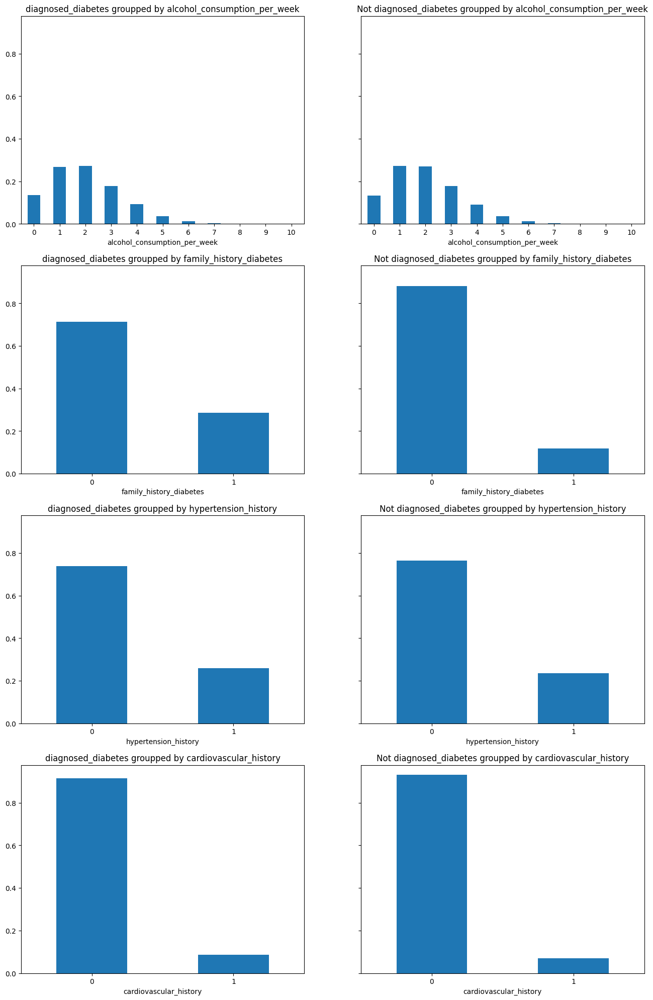

In [19]:
#search of diagnosed_diabetes column by numeric_categoric_columns
df_diabetes_diagnosed = df[df['diagnosed_diabetes'] == 1].copy()
df_not_diabetes_diagnosed = df[df['diagnosed_diabetes'] == 0].copy()
fig, ax = plt.subplots(nrows=len(numeric_categoric_columns), ncols=2, sharey=True, figsize=(16, 4*len(numeric_categoric_columns)))
for i, column in enumerate(numeric_categoric_columns):
    pd.crosstab(index=df_diabetes_diagnosed[column], columns=df_diabetes_diagnosed["diagnosed_diabetes"], normalize="columns").plot(kind="bar", ax=ax[i, 0], legend=False)
    pd.crosstab(index=df_not_diabetes_diagnosed[column], columns=df_not_diabetes_diagnosed["diagnosed_diabetes"], normalize="columns").plot(kind="bar", ax=ax[i, 1], legend=False)
    ax[i, 0].set_title(f'diagnosed_diabetes groupped by {column}')
    ax[i, 1].set_title(f'Not diagnosed_diabetes groupped by {column}')
    ax[i, 0].xaxis.set_tick_params(labelrotation=0)
    ax[i, 1].xaxis.set_tick_params(labelrotation=0)
    ax[i, 0].set_xlabel(column)
    ax[i, 1].set_xlabel(column)

plt.subplots_adjust(top=1.3)
plt.tight_layout;   

Number of diabetics type 2 in this dataset =  59774




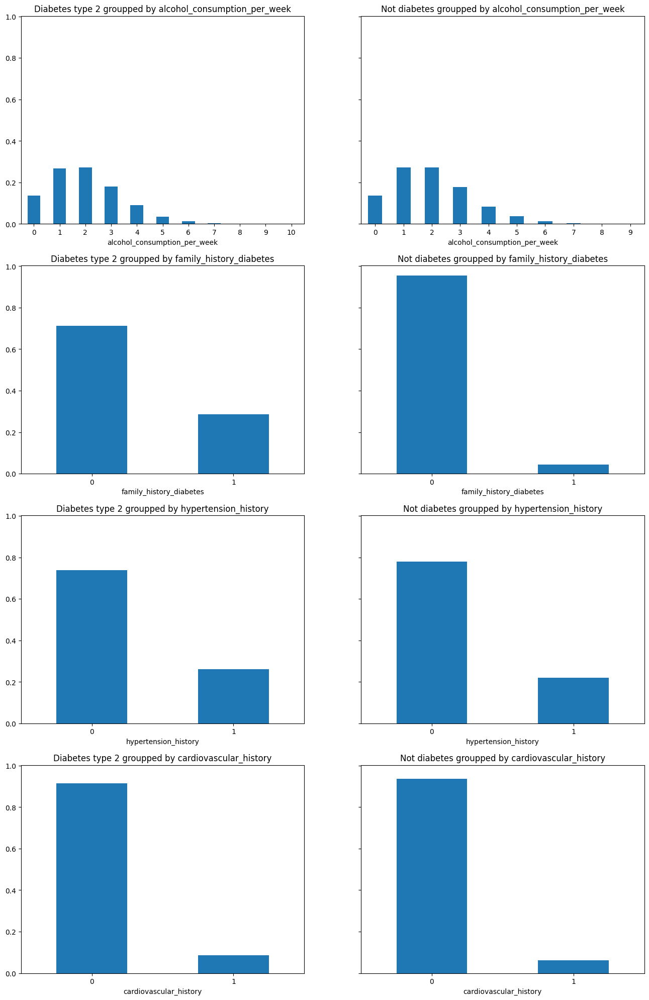

In [20]:
#search of diabetes type 2 by numeric_categoric_columns
df_diabetes_stage_type2 = df[df['diabetes_stage'] == 'Type 2'].copy()
df_diabetes_stage_no = df[df['diabetes_stage'] == 'No Diabetes']
print('Number of diabetics type 2 in this dataset = ', len(df_diabetes_stage_type2['diabetes_stage']))
print('\n')

fig, ax = plt.subplots(nrows=len(numeric_categoric_columns), ncols=2, sharey=True, figsize=(16, 4*len(numeric_categoric_columns)))
for i, column in enumerate(numeric_categoric_columns):
    pd.crosstab(index=df_diabetes_stage_type2[column], columns=df_diabetes_stage_type2["diabetes_stage"], normalize="columns").plot(kind="bar", ax=ax[i, 0], legend=False);
    pd.crosstab(index=df_diabetes_stage_no[column], columns=df_diabetes_stage_no["diabetes_stage"], normalize="columns").plot(kind="bar", ax=ax[i, 1], legend=False);
    ax[i, 0].set_title(f'Diabetes type 2 groupped by {column}');
    ax[i, 1].set_title(f'Not diabetes groupped by {column}');
    ax[i, 0].xaxis.set_tick_params(labelrotation=0);
    ax[i, 1].xaxis.set_tick_params(labelrotation=0);
    ax[i, 0].set_xlabel(column)
    ax[i, 1].set_xlabel(column)

plt.subplots_adjust(top=1.3)
plt.tight_layout;  

Number of diabetics Gestational in this dataset =  278




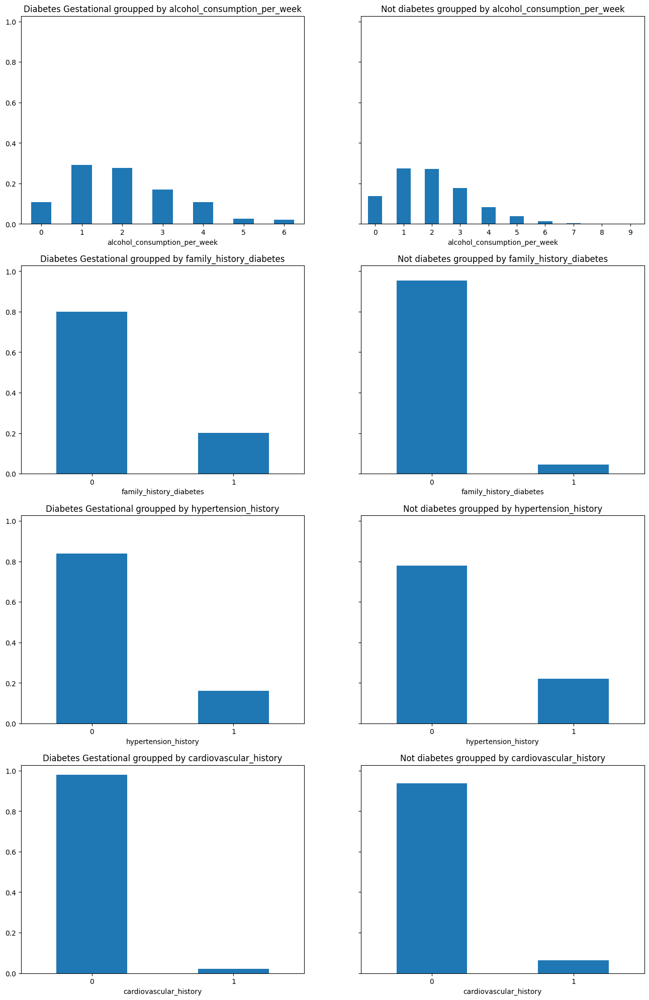

In [21]:
#search of diabetes Gestational by numeric_categoric_columns

df_diabetes_stage_gestational = df[df['diabetes_stage'] == 'Gestational'].copy()
df_diabetes_stage_no = df[df['diabetes_stage'] == 'No Diabetes']
print('Number of diabetics Gestational in this dataset = ', len(df_diabetes_stage_gestational['diabetes_stage']))
print('\n')
fig, ax = plt.subplots(nrows=len(numeric_categoric_columns), ncols=2, sharey=True, figsize=(16, 4*len(numeric_categoric_columns)));
for i, column in enumerate(numeric_categoric_columns):
    pd.crosstab(index=df_diabetes_stage_gestational[column], columns=df_diabetes_stage_gestational["diabetes_stage"], normalize="columns").plot(kind="bar", ax=ax[i, 0], legend=False);
    pd.crosstab(index=df_diabetes_stage_no[column], columns=df_diabetes_stage_no["diabetes_stage"], normalize="columns").plot(kind="bar", ax=ax[i, 1], legend=False);
    ax[i, 0].set_title(f'Diabetes Gestational groupped by {column}');
    ax[i, 1].set_title(f'Not diabetes groupped by {column}');
    ax[i, 0].xaxis.set_tick_params(labelrotation=0);
    ax[i, 1].xaxis.set_tick_params(labelrotation=0);
    ax[i, 0].set_xlabel(column);
    ax[i, 1].set_xlabel(column);

plt.subplots_adjust(top=1.3)
plt.tight_layout;  

Number of diabetics Gestational in this dataset =  31845




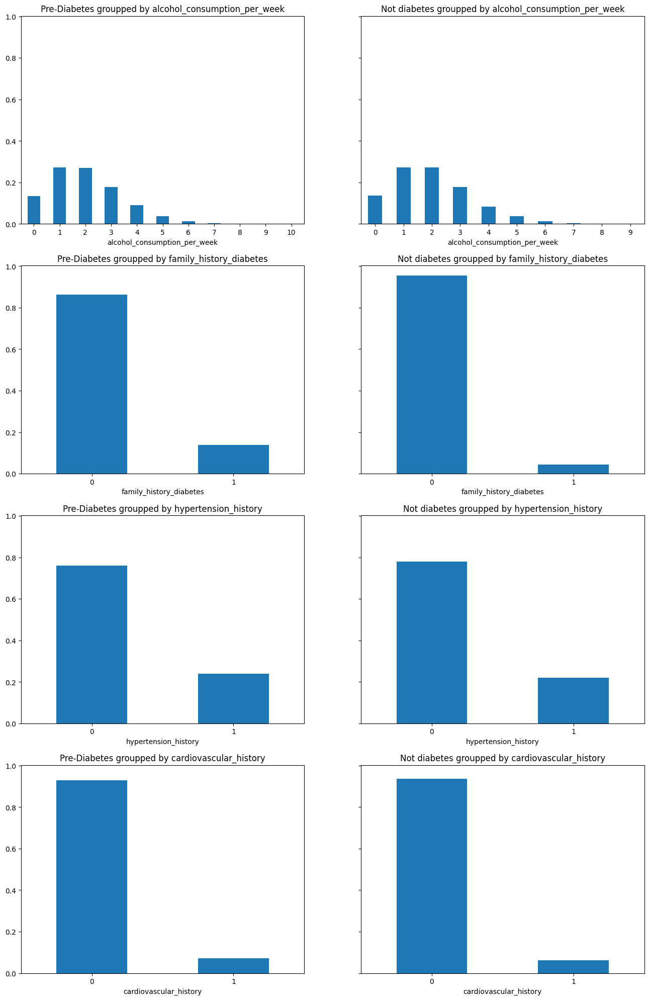

In [22]:
#search of Pre-Diabetes by numeric_categoric_columns
df_diabetes_stage_pre_diabetes = df[df['diabetes_stage'] == 'Pre-Diabetes']
df_diabetes_stage_no = df[df['diabetes_stage'] == 'No Diabetes'].copy()
print('Number of diabetics Gestational in this dataset = ', len(df_diabetes_stage_pre_diabetes['diabetes_stage']))
print('\n')
fig, ax = plt.subplots(nrows=len(numeric_categoric_columns), ncols=2, sharey=True, figsize=(16, 4*len(numeric_categoric_columns)));
for i, column in enumerate(numeric_categoric_columns):
    pd.crosstab(index=df_diabetes_stage_pre_diabetes[column], columns=df_diabetes_stage_pre_diabetes["diabetes_stage"], normalize="columns").plot(kind="bar", ax=ax[i, 0], legend=False);
    pd.crosstab(index=df_diabetes_stage_no[column], columns=df_diabetes_stage_no["diabetes_stage"], normalize="columns").plot(kind="bar", ax=ax[i, 1], legend=False);
    ax[i, 0].set_title(f'Pre-Diabetes groupped by {column}');
    ax[i, 1].set_title(f'Not diabetes groupped by {column}');
    ax[i, 0].xaxis.set_tick_params(labelrotation=0);
    ax[i, 1].xaxis.set_tick_params(labelrotation=0);
    ax[i, 0].set_xlabel(column);
    ax[i, 1].set_xlabel(column);

plt.subplots_adjust(top=1.3)
plt.tight_layout;  

Number of diabetics type 1 in this dataset =  122




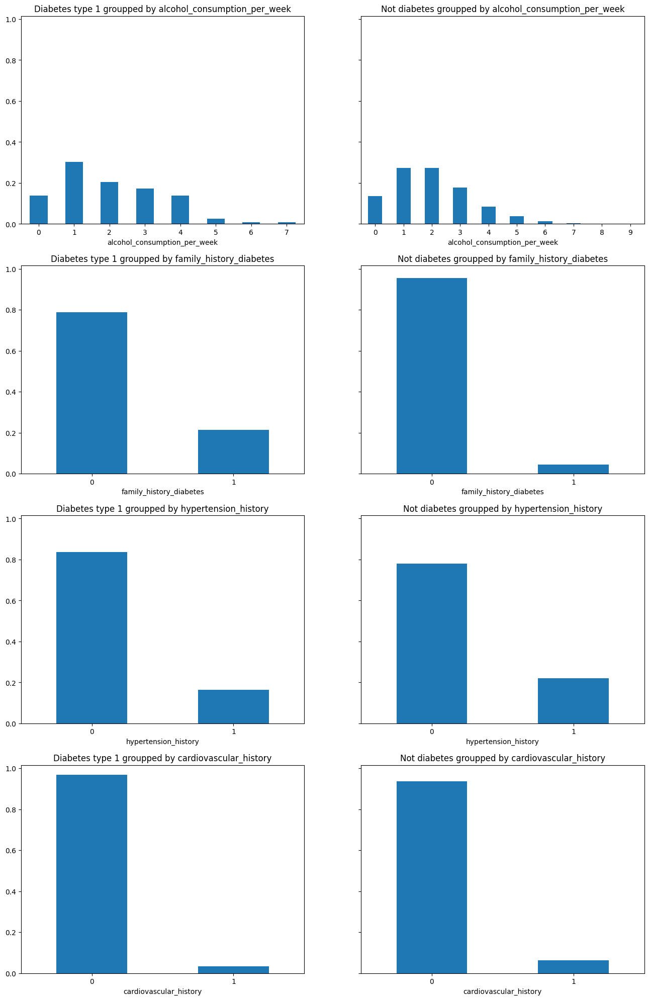

In [23]:
#search of diabetes type 1 by numeric_categoric_columns

df_diabetes_stage_type1 = df[df['diabetes_stage'] == 'Type 1'].copy()
df_diabetes_stage_no = df[df['diabetes_stage'] == 'No Diabetes'].copy()
print('Number of diabetics type 1 in this dataset = ', len(df_diabetes_stage_type1['diabetes_stage']))
print('\n')
fig, ax = plt.subplots(nrows=len(numeric_categoric_columns), ncols=2, sharey=True, figsize=(16, 4*len(numeric_categoric_columns)))
for i, column in enumerate(numeric_categoric_columns):
    pd.crosstab(index=df_diabetes_stage_type1[column], columns=df_diabetes_stage_type1["diabetes_stage"], normalize="columns").plot(kind="bar", ax=ax[i, 0], legend=False)
    pd.crosstab(index=df_diabetes_stage_no[column], columns=df_diabetes_stage_no["diabetes_stage"], normalize="columns").plot(kind="bar", ax=ax[i, 1], legend=False)
    ax[i, 0].set_title(f'Diabetes type 1 groupped by {column}')
    ax[i, 1].set_title(f'Not diabetes groupped by {column}')
    ax[i, 0].xaxis.set_tick_params(labelrotation=0)
    ax[i, 1].xaxis.set_tick_params(labelrotation=0)
    ax[i, 0].set_xlabel(column)
    ax[i, 1].set_xlabel(column)

plt.subplots_adjust(top=1.3)
plt.tight_layout;  

C:\Users\yamen\AppData\Local\Temp\ipykernel_4592\1955908313.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  order = df.groupby('diabetes_stage')['age'].median().sort_values().index;


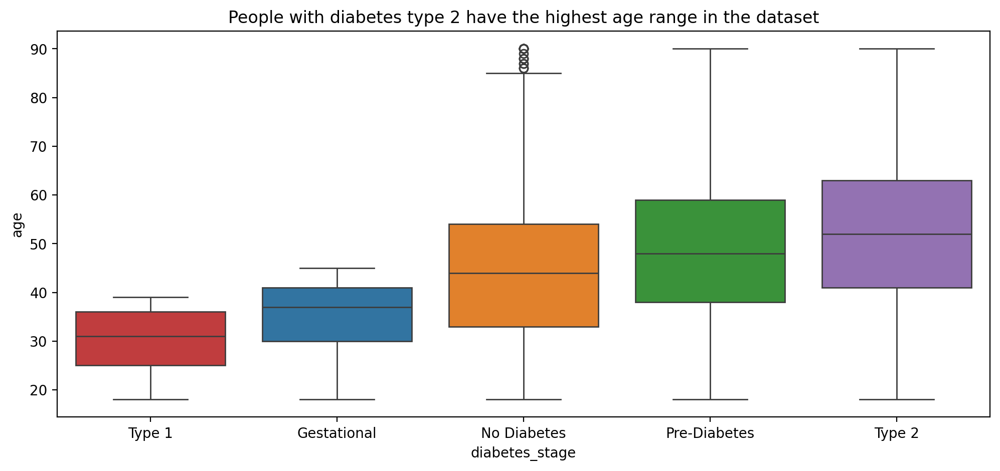

In [24]:
#Sortment of diabetes_stages classes according to age 
fig, ax=plt.subplots(figsize=(12, 5), dpi=200)
order = df.groupby('diabetes_stage')['age'].median().sort_values().index;
sns.boxplot(y='age', x='diabetes_stage', data=df, hue='diabetes_stage', order=order, ax=ax);
ax.set_title('People with diabetes type 2 have the highest age range in the dataset');

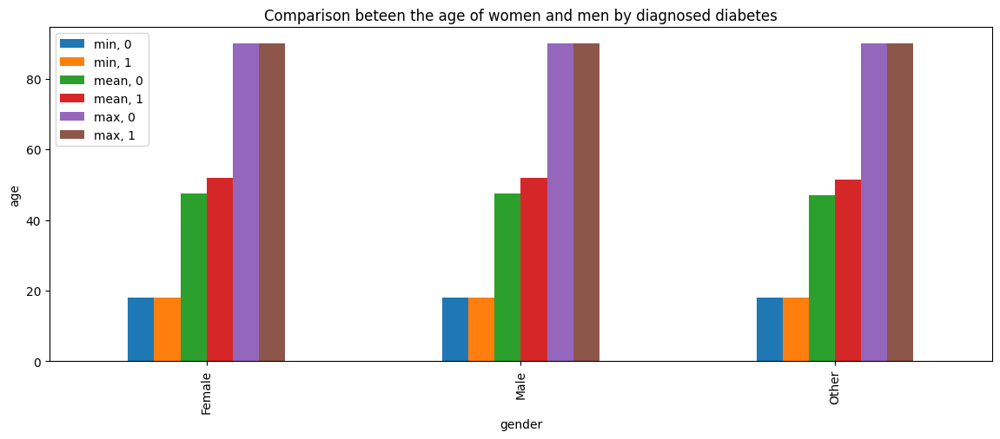

In [25]:
#Comparison beteen the age of women and men by diagnosed diabetes
fig, ax = plt.subplots(figsize=(14, 5))
pd.crosstab(df["gender"], 
            columns=df["diagnosed_diabetes"],
            values=df["age"],
            aggfunc=["min", "mean", "max"]).plot(kind = 'bar', ax=ax);
ax.set_ylabel('age');
plt.legend(['min, 0', 'min, 1', 'mean, 0', 'mean, 1', 'max, 0', 'max, 1']);
ax.set_title('Comparison beteen the age of women and men by diagnosed diabetes');

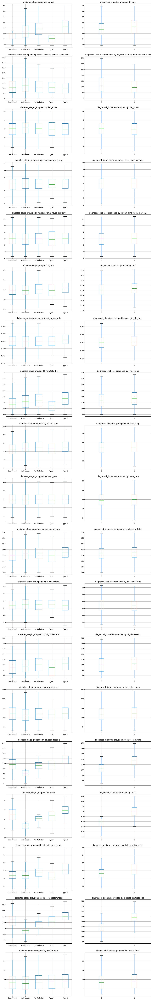

In [26]:
#search by numeric_numeric_columns with boxplot
fig, ax = plt.subplots(nrows=len(numeric_numeric_columns), ncols=2, figsize=(16, 4*len(numeric_numeric_columns)))
for i, column in enumerate(numeric_numeric_columns):
    df.boxplot(by='diabetes_stage', column=column, ax=ax[i, 0], showfliers=False);
    df.boxplot(by='diagnosed_diabetes', column=column, ax=ax[i, 1], showfliers=False);
    ax[i, 0].set_title(f'diabetes_stage groupped by {column}');
    ax[i, 1].set_title(f'diagnosed_diabetes groupped by {column}');
    ax[i, 0].xaxis.set_tick_params(labelrotation=0);
    ax[i, 1].xaxis.set_tick_params(labelrotation=0);
    ax[i, 0].set_xlabel(None)
    ax[i, 1].set_xlabel(None)

plt.suptitle("")
plt.subplots_adjust(top=1.3)
plt.tight_layout;

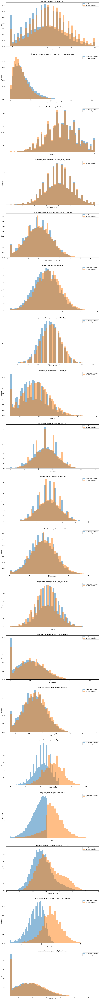

In [27]:
#search of diagnosed_diabetes by numeric_numeric_columns and visualization with histogram
fig, ax = plt.subplots(nrows=len(numeric_numeric_columns), ncols=1, figsize=(16, 5*len(numeric_numeric_columns)));
for i, column in enumerate(numeric_numeric_columns):
    df.groupby('diagnosed_diabetes')[column].plot(kind='hist', ax=ax[i], legend=True, alpha=0.5, density=True, bins=50);
    ax[i].set_title(f'diagnosed_diabetes groupped by {column}');
    ax[i].xaxis.set_tick_params(labelrotation=0);
    ax[i].set_xlabel(column);
    ax[i].legend(['Not diabetes diagnosed', 'Diabetes diagnosed'])
    
plt.suptitle("");
plt.subplots_adjust(top=1.5);
plt.tight_layout;  

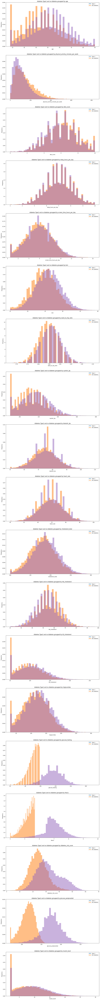

In [28]:
#search of Diabetes Type2 and No Diabetes in diabetes_stage column by numeric_numeric_columns and visualization with histogram
warnings.filterwarnings("ignore")
df_diabetic_stage_type2_no = df[df['diabetes_stage'].isin(['Type 2', 'No Diabetes'])].copy()
fig, ax = plt.subplots(nrows=len(numeric_numeric_columns), ncols=1, figsize=(16, 5*len(numeric_numeric_columns)));
for i, column in enumerate(numeric_numeric_columns):
    df_diabetic_stage_type2_no.groupby('diabetes_stage')[column].plot(kind='hist', ax=ax[i], legend=True, alpha=0.5, density=True, bins=50);
    ax[i].set_title(f'diabetes Type2 and no diabetes groupped by {column}');
    ax[i].xaxis.set_tick_params(labelrotation=0);
    ax[i].set_xlabel(column);
    ax[i].legend(['Type 2', 'No Diabetes'])

    
plt.suptitle("");
plt.subplots_adjust(top=1.5);
plt.tight_layout;  

5- Linear Regression of diabetes_risk_score with numeric columns

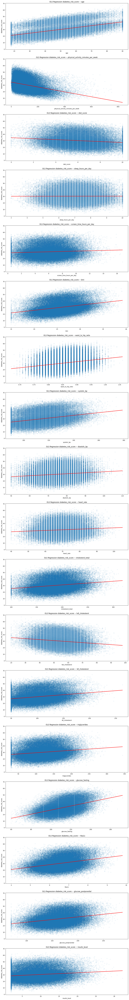

In [29]:
#Linear Regression of diabetes_risk_score with numeric_numeric_columns(visualization)
numeric_numeric_columns_without_diabetes_risk_score = [part for part in numeric_numeric_columns if part != 'diabetes_risk_score']

fig,ax = plt.subplots(nrows=len(numeric_numeric_columns_without_diabetes_risk_score), ncols=1, figsize=(16, 4*len(numeric_numeric_columns_without_diabetes_risk_score)))
for i, col in enumerate(numeric_numeric_columns_without_diabetes_risk_score):
    sns.regplot(x = col, y = 'diabetes_risk_score', data = df, ci = None, line_kws={"color": "red"}, ax=ax[i], scatter_kws={"alpha": 0.05})
    ax[i].set(xlabel = col,
       ylabel = 'diabetes_risk_score',
       title = f'OLS Regression diabetes_risk_score ~ {col}');
    
plt.subplots_adjust(top=1.5);
plt.suptitle("");
plt.tight_layout;  

In [30]:
#Linear Regression of diabetes_risk_score with numeric_numeric_columns(calculation of correlation for each model)
formulas = [f'diabetes_risk_score ~ {col}' for col in numeric_numeric_columns_without_diabetes_risk_score]
results_list = []
for i, formula in enumerate(formulas):
    model = smf.ols(formula=formula, data=df)
    results = model.fit()

    var = formula.split("~")[1].strip()
    slope = results.params[var]
    
    df_result = pd.DataFrame({
        'Formula': [formula],
        'R-squared': [results.rsquared],
        'Adj. R-squared': [results.rsquared_adj],
        'F p-value': [results.f_pvalue],
        'Intercept': [results.params['Intercept']],
        'slope': slope
                                    
    })

    results_list.append(df_result)

df_results_linear = pd.concat(results_list)
df_results_linear_sorted = df_results_linear.sort_values(by='Adj. R-squared', ascending=False)
pd.options.display.float_format = "{:.3f}".format


def highlight_negative(row):
    if row["slope"] < 0:
        return ['background-color: red'] * len(row)
    return [''] * len(row)

df_results_linear_sorted = df_results_linear_sorted.reset_index(drop=True)

df_results_linear_sorted_styled = df_results_linear_sorted.style.apply(highlight_negative, axis=1)
df_results_linear_sorted_styled

,Formula,R-squared,Adj. R-squared,F p-value,Intercept,slope
0,diabetes_risk_score ~ age,0.245941,0.245933,0.000000,15.788672,0.287980
1,diabetes_risk_score ~ glucose_fasting,0.220842,0.220834,0.000000,-4.581173,0.313215
2,diabetes_risk_score ~ physical_activity_minutes_per_week,0.121188,0.121179,0.000000,34.666246,-0.037371
3,diabetes_risk_score ~ hba1c,0.108865,0.108856,0.000000,6.269254,3.673352
4,diabetes_risk_score ~ systolic_bp,0.104711,0.104702,0.000000,6.451121,0.205279
5,diabetes_risk_score ~ bmi,0.098479,0.098470,0.000000,9.916060,0.792823
6,diabetes_risk_score ~ glucose_postprandial,0.076752,0.076742,0.000000,17.235548,0.081150
7,diabetes_risk_score ~ waist_to_hip_ratio,0.058395,0.058386,0.000000,-9.800658,46.751604
8,diabetes_risk_score ~ ldl_cholesterol,0.051880,0.051871,0.000000,23.855574,0.061813
9,diabetes_risk_score ~ cholesterol_total,0.039202,0.039192,0.000000,19.799453,0.056044


In [31]:
#Linear Regression of bmi with numeric_numeric_columns(calculation of correlation for each model)
numeric_numeric_columns_without_bmi = [part for part in numeric_numeric_columns if part != 'bmi']

formulas = [f'bmi ~ {col}' for col in numeric_numeric_columns_without_bmi]
results_list = []
for i, formula in enumerate(formulas):
    model = smf.ols(formula=formula, data=df)
    results = model.fit()

    var = formula.split("~")[1].strip()
    slope = results.params[var]
    
    df_result = pd.DataFrame({
        'Formula': [formula],
        'R-squared': [results.rsquared],
        'Adj. R-squared': [results.rsquared_adj],
        'F p-value': [results.f_pvalue],
        'Intercept': [results.params['Intercept']],
        'slope': slope
                                    
    })

    results_list.append(df_result)

df_results_linear = pd.concat(results_list)
df_results_linear_sorted = df_results_linear.sort_values(by='Adj. R-squared', ascending=False)
pd.options.display.float_format = "{:.3f}".format


def highlight_negative(row):
    if row["slope"] < 0:
        return ['background-color: red'] * len(row)
    return [''] * len(row)

df_results_linear_sorted = df_results_linear_sorted.reset_index(drop=True)

df_results_linear_sorted_styled = df_results_linear_sorted.style.apply(highlight_negative, axis=1)
df_results_linear_sorted_styled

,Formula,R-squared,Adj. R-squared,F p-value,Intercept,slope
0,bmi ~ waist_to_hip_ratio,0.586363,0.586359,0.000000,-24.587009,58.639122
1,bmi ~ triglycerides,0.164566,0.164558,0.000000,21.537976,0.033547
2,bmi ~ insulin_level,0.153588,0.153580,0.000000,23.041658,0.283735
3,bmi ~ diabetes_risk_score,0.098479,0.098470,0.000000,21.858644,0.124213
4,bmi ~ systolic_bp,0.060174,0.060165,0.000000,18.479924,0.061595
5,bmi ~ ldl_cholesterol,0.056659,0.056650,0.000000,22.979046,0.025569
6,bmi ~ hdl_cholesterol,0.044901,0.044892,0.000000,29.613054,-0.074023
7,bmi ~ diet_score,0.040523,0.040513,0.000000,28.042997,-0.405410
8,bmi ~ cholesterol_total,0.039939,0.039930,0.000000,21.448446,0.022391
9,bmi ~ glucose_fasting,0.022779,0.022770,0.000000,21.188300,0.039817


In [32]:
#Linear Regression of age with numeric_numeric_columns(calculation of correlation for each model)
numeric_numeric_columns_without_age = [part for part in numeric_numeric_columns if part != 'age']

formulas = [f'age ~ {col}' for col in numeric_numeric_columns_without_age]
results_list = []
for i, formula in enumerate(formulas):
    model = smf.ols(formula=formula, data=df)
    results = model.fit()

    var = formula.split("~")[1].strip()
    slope = results.params[var]
    
    df_result = pd.DataFrame({
        'Formula': [formula],
        'R-squared': [results.rsquared],
        'Adj. R-squared': [results.rsquared_adj],
        'F p-value': [results.f_pvalue],
        'Intercept': [results.params['Intercept']],
        'slope': slope
                                    
    })

    results_list.append(df_result)

df_results_linear = pd.concat(results_list)
df_results_linear_sorted = df_results_linear.sort_values(by='Adj. R-squared', ascending=False)
pd.options.display.float_format = "{:.3f}".format


def highlight_negative(row):
    if row["slope"] < 0:
        return ['background-color: red'] * len(row)
    return [''] * len(row)

df_results_linear_sorted = df_results_linear_sorted.reset_index(drop=True)

df_results_linear_sorted_styled = df_results_linear_sorted.style.apply(highlight_negative, axis=1)
df_results_linear_sorted_styled
#age_correlated_columns = ['systolic_bp', 'diabetes_risk_score']

,Formula,R-squared,Adj. R-squared,F p-value,Intercept,slope
0,age ~ systolic_bp,0.299971,0.299964,0.000000,-19.165827,0.598329
1,age ~ diabetes_risk_score,0.245941,0.245933,0.000000,24.309948,0.854019
2,age ~ cholesterol_total,0.095925,0.095916,0.000000,22.043214,0.150970
3,age ~ ldl_cholesterol,0.079116,0.079107,0.000000,36.580881,0.131451
4,age ~ glucose_fasting,0.053608,0.053598,0.000000,20.591422,0.265747
5,age ~ diastolic_bp,0.038808,0.038798,0.000000,21.931546,0.374690
6,age ~ hba1c,0.025423,0.025414,0.000000,30.186785,3.056941
7,age ~ glucose_postprandial,0.017551,0.017541,0.000000,39.425963,0.066826
8,age ~ bmi,0.008583,0.008573,0.000000,39.796989,0.403059
9,age ~ waist_to_hip_ratio,0.004852,0.004842,0.000000,30.253927,23.206393


6- Logistic regression with diagnosed_diabetes variable

In [33]:
#logistic regression with diagnosed_diabetes variable
formulas = [f'diagnosed_diabetes ~ {col}' for col in numeric_numeric_columns]
results_list = []
for i, formula in enumerate(formulas):
    model = smf.logit(formula=formula, data=df)
    results = model.fit(disp=False)

    log_likelihood = results.llf
    ll_null = results.llnull
    pseudo_r_squared = results.prsquared
    llr_pvalue = results.llr_pvalue
    intercept = results.params['Intercept']
    var = formula.split("~")[1].strip()
    slope = results.params[var]

    
    df_result = pd.DataFrame({'Formula': formula,
        'Log-Likelihood': log_likelihood,
        'LL-Null': ll_null,
        'Pseudo R-squared': pseudo_r_squared,
        'LLR p-value': llr_pvalue,
        'Intercept': intercept,
        'slope': slope}, index=[0])
    
    results_list.append(df_result)

df_results_logit = pd.concat(results_list)
df_results_logit_sorted = df_results_logit.sort_values(by='Pseudo R-squared', ascending=False)
pd.options.display.float_format = "{:.3f}".format


def highlight_negative(row):
    if row["slope"] < 0:
        return ['background-color: red'] * len(row)
    return [''] * len(row)

df_results_logit_sorted = df_results_logit_sorted.reset_index(drop=True)
df_results_logit_sorted_styled = df_results_logit_sorted.style.apply(highlight_negative, axis=1)
df_results_logit_sorted_styled.to_excel("logistic regression.xlsx", index=False)
df_results_logit_sorted_styled

,Formula,Log-Likelihood,LL-Null,Pseudo R-squared,LLR p-value,Intercept,slope
0,diagnosed_diabetes ~ hba1c,-35196.549329,-67301.977548,0.477035,0.000000,-22.932984,3.652720
1,diagnosed_diabetes ~ glucose_postprandial,-41535.576799,-67301.977548,0.382848,0.000000,-11.141431,0.074203
2,diagnosed_diabetes ~ glucose_fasting,-52040.814151,-67301.977548,0.226757,0.000000,-11.249499,0.106347
3,diagnosed_diabetes ~ diabetes_risk_score,-63216.486662,-67301.977548,0.060704,0.000000,-1.663281,0.069952
4,diagnosed_diabetes ~ age,-66344.213723,-67301.977548,0.014231,0.000000,-0.506804,0.018364
5,diagnosed_diabetes ~ physical_activity_minutes_per_week,-66798.771040,-67301.977548,0.007477,0.000000,0.695910,-0.002416
6,diagnosed_diabetes ~ bmi,-66828.740968,-67301.977548,0.007032,0.000000,-1.018798,0.055759
7,diagnosed_diabetes ~ systolic_bp,-66842.962546,-67301.977548,0.006820,0.000000,-1.190548,0.013816
8,diagnosed_diabetes ~ waist_to_hip_ratio,-66989.585165,-67301.977548,0.004642,0.000000,-2.555017,3.461147
9,diagnosed_diabetes ~ ldl_cholesterol,-67073.200017,-67301.977548,0.003399,0.000000,-0.021120,0.004160


In [34]:
def logistic_prediction(df: pd.DataFrame, feature: str, target: str) -> pd.Series:

    """
    return datafram series for the predicted target
    
    Parameters:
    -----------
    df : Datafram 
    feature : str (column name for independent Variable)
    target : str (column name for target variable(0/1))
    """

    model = smf.logit(formula=f'{target} ~ {feature}', data=df)
    results = model.fit(disp=False)

    value_range = np.linspace(df[feature].min(), df[feature].max(), 300)
    value_range_df = pd.DataFrame(value_range)
    value_range_df.columns=[feature]

    predicted_target = results.predict(value_range_df)
    return value_range, predicted_target

The value of hba1c by probability of diagnosed diabetics of 50% = 6.29
The value of hba1c by probability of diagnosed diabetics of 65% = 6.4635


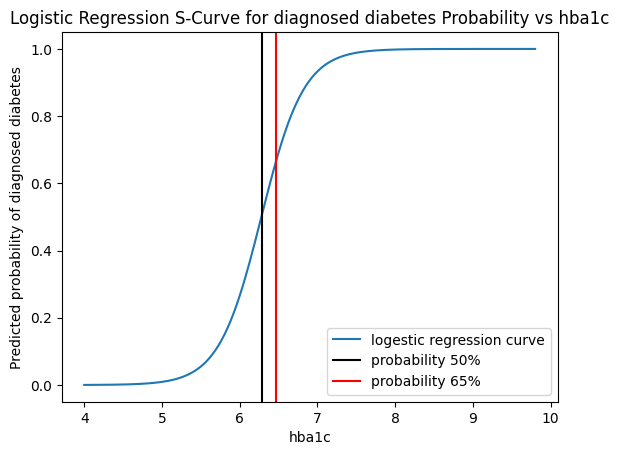

In [35]:
#We take here the first four models for logistic regression
#hba1c
value_range, predicted_hba1c = logistic_prediction(df, feature='hba1c', target='diagnosed_diabetes')

fig, ax = plt.subplots()

ax.plot(value_range, predicted_hba1c);
ax.set_xlabel("hba1c");
ax.set_ylabel("Predicted probability of diagnosed diabetes");
ax.set_title('Logistic Regression S-Curve for diagnosed diabetes Probability vs hba1c')
p_50_index = predicted_hba1c[predicted_hba1c>=0.5].index[0]
p_50_value = value_range[p_50_index]
ax.axvline(p_50_value, color='black')
print('The value of hba1c by probability of diagnosed diabetics of 50% =', p_50_value.round(2))

p_65_index = predicted_hba1c[predicted_hba1c>=0.65].index[0]
p_65_value = value_range[p_65_index]
ax.axvline(p_65_value, color='red')
print('The value of hba1c by probability of diagnosed diabetics of 65% =', p_65_value.round(4))

plt.legend(['logestic regression curve', 'probability 50%', 'probability 65%']);

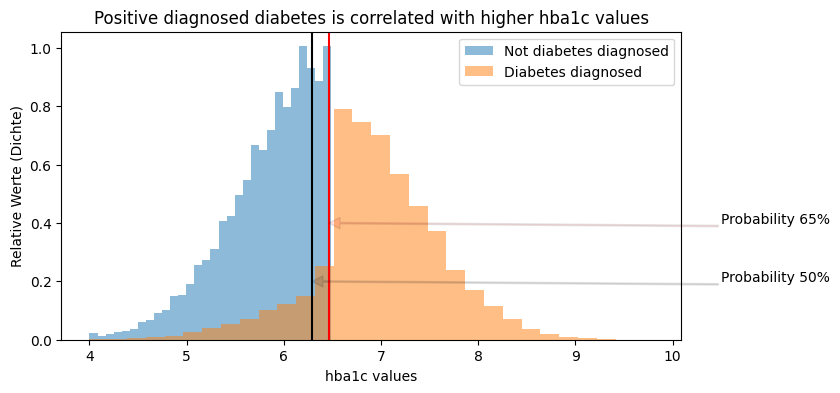

In [36]:
#hba1c visualization by histogram
fig, ax=plt.subplots(figsize=(8, 4))
df.groupby('diagnosed_diabetes')['hba1c'].plot(kind='hist', ax=ax, bins = 30, legend=True, alpha=0.5, density=True);
ax.set_title('Positive diagnosed diabetes is correlated with higher hba1c values');
ax.set_xlabel('hba1c values');
ax.set_ylabel('Relative Werte (Dichte)')
ax.legend(['Not diabetes diagnosed', 'Diabetes diagnosed'])
ax.axvline(p_50_value, color='black');
ax.axvline(p_65_value, color='red');

ax.annotate(text='Probability 50%',
          xy=(p_50_value, 0.2),
          xytext=(10.5, 0.2),
          arrowprops=dict(facecolor='black', alpha=0.1, width=1, headwidth=8, headlength=8));

ax.annotate(text='Probability 65%',
          xy=(p_65_value, 0.4),
          xytext=(10.5, 0.4),
          arrowprops=dict(facecolor='red', alpha=0.1, width=1, headwidth=8, headlength=8));

plt.show()

The value of glucose_postprandial by probability of diagnosed diabetics of 50% = 150.56
The value of glucose_postprandial by probability of diagnosed diabetics of 62% = 157.09


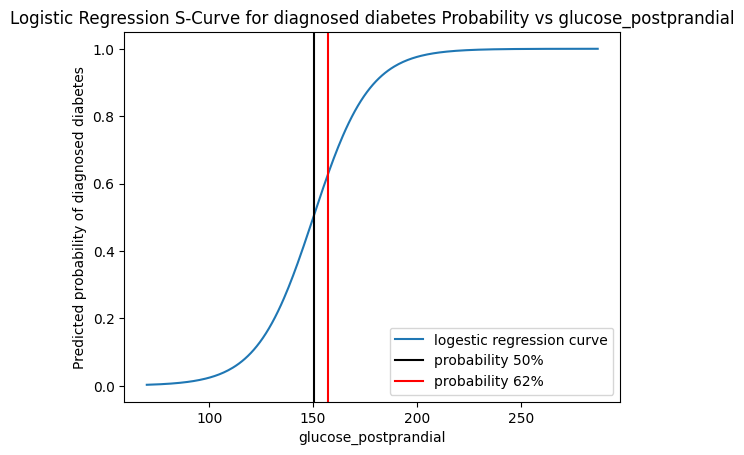

In [37]:
#logistic regression glucose_postprandial
value_range, predicted_glucose_postprandial = logistic_prediction(df, feature='glucose_postprandial', target='diagnosed_diabetes')
fig, ax = plt.subplots()

ax.plot(value_range, predicted_glucose_postprandial);
ax.set_xlabel("glucose_postprandial");
ax.set_ylabel("Predicted probability of diagnosed diabetes");
ax.set_title('Logistic Regression S-Curve for diagnosed diabetes Probability vs glucose_postprandial')
p_50_index = predicted_glucose_postprandial[predicted_glucose_postprandial>=0.5].index[0]
p_50_value = value_range[p_50_index]
ax.axvline(p_50_value, color='black');
print('The value of glucose_postprandial by probability of diagnosed diabetics of 50% =', p_50_value.round(2))
p_62_index = predicted_glucose_postprandial[predicted_glucose_postprandial>=0.62].index[0]
p_62_value = value_range[p_62_index]
ax.axvline(p_62_value, color='red');
print('The value of glucose_postprandial by probability of diagnosed diabetics of 62% =', p_62_value.round(2))

plt.legend(['logestic regression curve', 'probability 50%', 'probability 62%']);

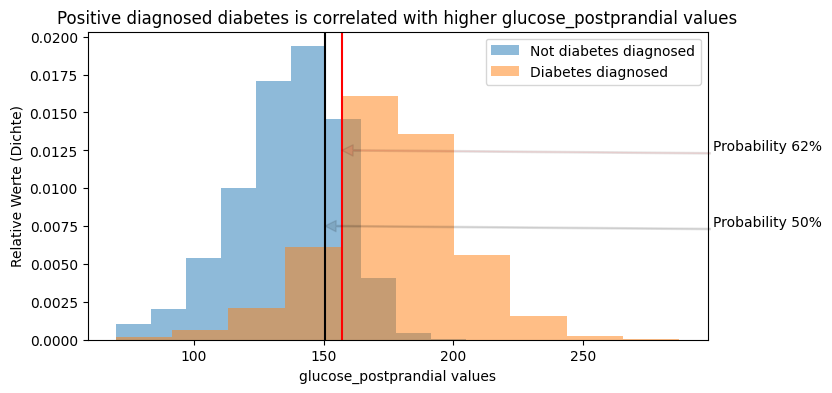

In [38]:
#glucose_postprandial visualization by histogram
fig, ax=plt.subplots(figsize=(8, 4))
df.groupby('diagnosed_diabetes')['glucose_postprandial'].plot(kind='hist', ax=ax, legend=True, alpha=0.5, density=True);
ax.set_title('Positive diagnosed diabetes is correlated with higher glucose_postprandial values');
ax.set_xlabel('glucose_postprandial values');
ax.set_ylabel('Relative Werte (Dichte)')
ax.legend(['Not diabetes diagnosed', 'Diabetes diagnosed'])
ax.axvline(p_50_value, color='black');
ax.axvline(p_62_value, color='red');

ax.annotate(text='Probability 50%',
          xy=(p_50_value, 0.0075),
          xytext=(300, 0.0075),
          arrowprops=dict(facecolor='black', alpha=0.1, width=1, headwidth=8, headlength=8));

ax.annotate(text='Probability 62%',
          xy=(p_62_value, 0.0125),
          xytext=(300, 0.0125),
          arrowprops=dict(facecolor='red', alpha=0.1, width=1, headwidth=8, headlength=8));

plt.show()

The value of glucose_fasting by probability of diagnosed diabetics of 50% = 106.07


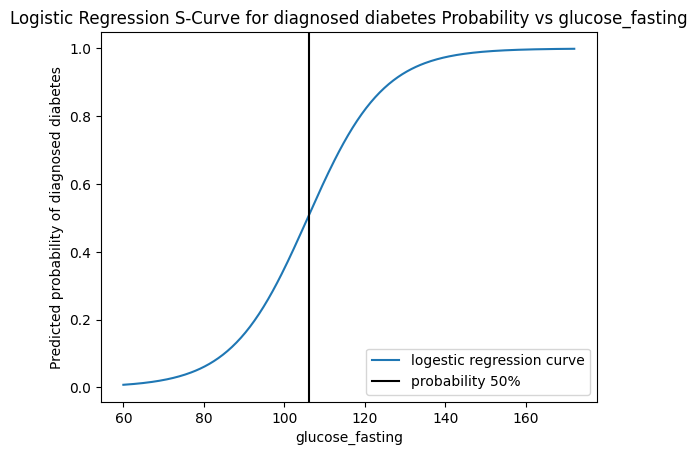

In [39]:
#logistic regression glucose_fasting
value_range, predicted_glucose_fasting = logistic_prediction(df, feature='glucose_fasting', target='diagnosed_diabetes')
fig, ax = plt.subplots()

ax.plot(value_range, predicted_glucose_fasting);
ax.set_xlabel("glucose_fasting");
ax.set_ylabel("Predicted probability of diagnosed diabetes");
ax.set_title('Logistic Regression S-Curve for diagnosed diabetes Probability vs glucose_fasting')
p_50_index = predicted_glucose_fasting[predicted_glucose_fasting >=0.5].index[0]
p_50_value = value_range[p_50_index]
ax.axvline(p_50_value, color='black');
print('The value of glucose_fasting by probability of diagnosed diabetics of 50% =', p_50_value.round(2))
plt.legend(['logestic regression curve', 'probability 50%']);

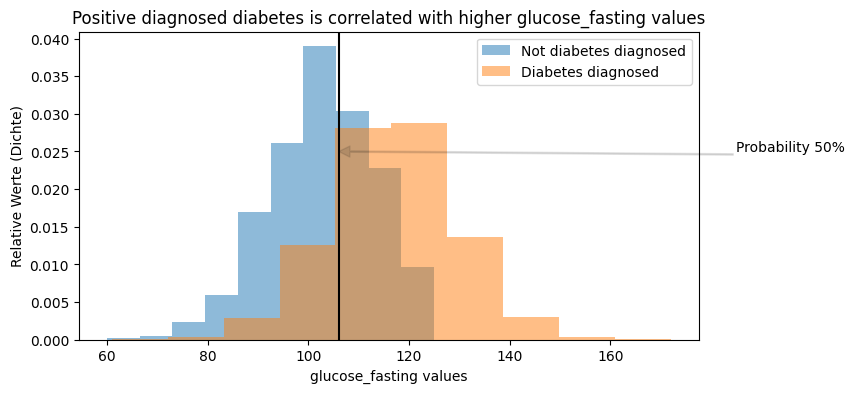

In [40]:
#glucose_fasting visualization by histogram
fig, ax=plt.subplots(figsize=(8, 4))
df.groupby('diagnosed_diabetes')['glucose_fasting'].plot(kind='hist', ax=ax, legend=True, alpha=0.5, density=True);
ax.set_title('Positive diagnosed diabetes is correlated with higher glucose_fasting values');
ax.set_xlabel('glucose_fasting values');
ax.set_ylabel('Relative Werte (Dichte)')
ax.legend(['Not diabetes diagnosed', 'Diabetes diagnosed'])
ax.axvline(p_50_value, color='black');

ax.annotate(text='Probability 50%',
          xy=(p_50_value, 0.025),
          xytext=(185, 0.025),
          arrowprops=dict(facecolor='black', alpha=0.1, width=1, headwidth=8, headlength=8));

plt.show()

The value of diabetes_risk_score by probability of diagnosed diabetics of 50% = 23.84


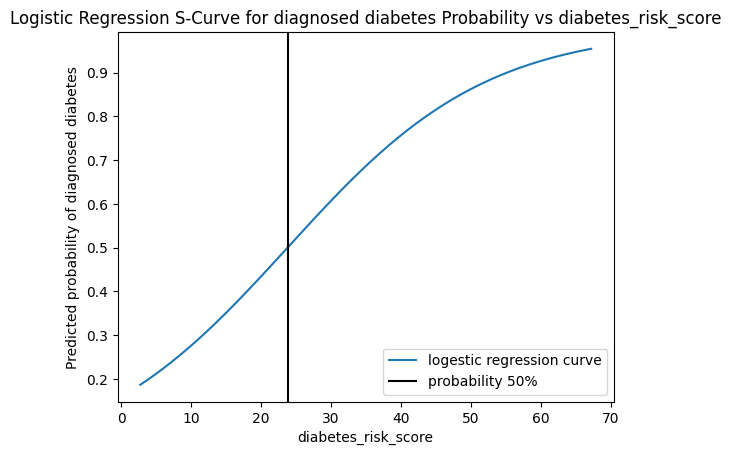

In [41]:
#diabetes_risk_score
value_range, predicted_diabetes_risk_score = logistic_prediction(df, feature='diabetes_risk_score', target='diagnosed_diabetes')
fig, ax = plt.subplots()

ax.plot(value_range, predicted_diabetes_risk_score);
ax.set_xlabel("diabetes_risk_score");
ax.set_ylabel("Predicted probability of diagnosed diabetes");
ax.set_title('Logistic Regression S-Curve for diagnosed diabetes Probability vs diabetes_risk_score')
p_50_index = predicted_diabetes_risk_score[predicted_diabetes_risk_score>=0.5].index[0]
p_50_value = value_range[p_50_index]
ax.axvline(p_50_value, color='black')
print('The value of diabetes_risk_score by probability of diagnosed diabetics of 50% =', p_50_value.round(2))

plt.legend(['logestic regression curve', 'probability 50%']);

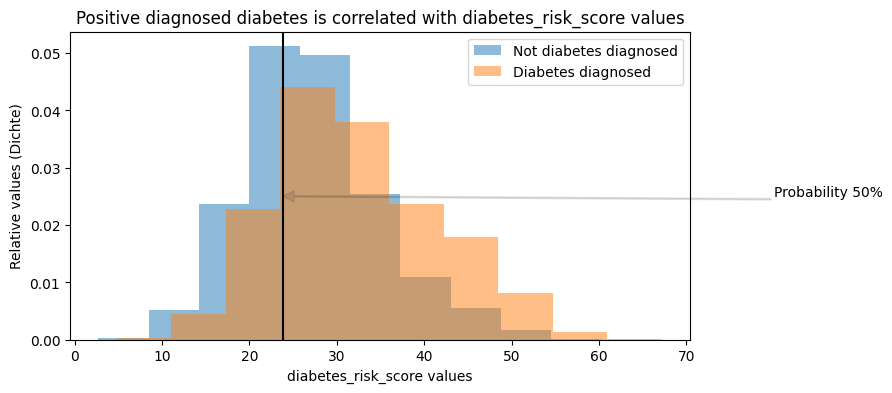

In [42]:
#diabetes_risk_score visualization by histogram
fig, ax=plt.subplots(figsize=(8, 4))
df.groupby('diagnosed_diabetes')['diabetes_risk_score'].plot(kind='hist', ax=ax, legend=True, alpha=0.5, density=True);
ax.set_title('Positive diagnosed diabetes is correlated with diabetes_risk_score values');
ax.set_xlabel('diabetes_risk_score values');
ax.set_ylabel('Relative values (Dichte)')
ax.legend(['Not diabetes diagnosed', 'Diabetes diagnosed'])
ax.axvline(p_50_value, color='black');

ax.annotate(text='Probability 50%',
          xy=(p_50_value, 0.025),
          xytext=(80, 0.025),
          arrowprops=dict(facecolor='black', alpha=0.1, width=1, headwidth=8, headlength=8));

plt.show()

In [43]:
#Making of new dataphram with only two categories Type 2 and No Diabetes by diabetes_stage column
df_diabetic_stage_type2_no = df[df['diabetes_stage'].isin(['Type 2', 'No Diabetes'])].copy()
df_diabetic_stage_type2_no['diabetes_stage'] = df_diabetic_stage_type2_no['diabetes_stage'].map({'No Diabetes': 0, 'Type 2': 1}).astype(int)
df_diabetic_stage_type2_no['diabetes_stage'].dtype

dtype('int64')

7- Focusing on diabetes type2 by logistic regression

In [44]:
# logestic regression
formulas = [f'diabetes_stage ~ {col}' for col in numeric_numeric_columns]
results_list = []
for i, formula in enumerate(formulas):
    model = smf.logit(formula=formula, data=df_diabetic_stage_type2_no)
    results = model.fit(disp=False)

    log_likelihood = results.llf
    ll_null = results.llnull
    pseudo_r_squared = results.prsquared
    llr_pvalue = results.llr_pvalue
    intercept = results.params['Intercept']
    var = formula.split("~")[1].strip()
    slope = results.params[var]

    df_result = pd.DataFrame({'Formula': formula,
        'Log-Likelihood': log_likelihood,
        'LL-Null': ll_null,
        'Pseudo R-squared': pseudo_r_squared,
        'LLR p-value': llr_pvalue,
        'Intercept': intercept,
        'slope': slope}, index=[0])
    
    results_list.append(df_result)

df_type2_results_logit = pd.concat(results_list)
df_type2_results_logit_sorted = df_type2_results_logit.sort_values(by='Pseudo R-squared', ascending=False)
pd.options.display.float_format = "{:.3f}".format


def highlight_negative(row):
    if row["slope"] < 0:
        return ['background-color: red'] * len(row)
    return [''] * len(row)

df_type2_results_logit_sorted = df_type2_results_logit_sorted.reset_index(drop=True)
df_type2_results_logit_sorted_styled = df_type2_results_logit_sorted.style.apply(highlight_negative, axis=1)
df_type2_results_logit_sorted_styled.to_excel("logistic_regression_tab_type_2.xlsx", index=False)
df_type2_results_logit_sorted_styled

,Formula,Log-Likelihood,LL-Null,Pseudo R-squared,LLR p-value,Intercept,slope
0,diabetes_stage ~ hba1c,-7530.380144,-24561.362900,0.693405,0.000000,-24.417436,4.423334
1,diabetes_stage ~ glucose_fasting,-9876.768197,-24561.362900,0.597874,0.000000,-23.581133,0.252391
2,diabetes_stage ~ glucose_postprandial,-10033.027512,-24561.362900,0.591512,0.000000,-11.880500,0.096860
3,diabetes_stage ~ diabetes_risk_score,-21312.685901,-24561.362900,0.132268,0.000000,-1.537674,0.127894
4,diabetes_stage ~ age,-23712.067110,-24561.362900,0.034579,0.000000,0.457884,0.032345
5,diabetes_stage ~ physical_activity_minutes_per_week,-24066.609461,-24561.362900,0.020144,0.000000,2.536309,-0.004116
6,diabetes_stage ~ bmi,-24126.681144,-24561.362900,0.017698,0.000000,-0.480995,0.098717
7,diabetes_stage ~ systolic_bp,-24183.390662,-24561.362900,0.015389,0.000000,-0.673435,0.023449
8,diabetes_stage ~ waist_to_hip_ratio,-24272.816886,-24561.362900,0.011748,0.000000,-3.234461,6.156563
9,diabetes_stage ~ ldl_cholesterol,-24352.155619,-24561.362900,0.008518,0.000000,1.261310,0.007463


compared to other diabetes types has diabetes type 2 more correlation with the first four variables in the table (hba1c, glucose_fasting, glucose_postprandial, diabetes_risk_score)

The value of hba1c by probability of diabetes type 2 of 50% = 5.53
The value of hba1c by probability of diabetes type 2 of 65% = 5.67


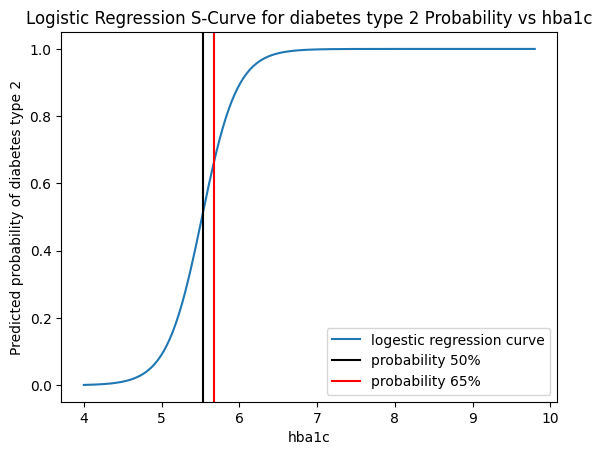

In [45]:
#Logestic regression with hba1c by diabetes type 2
value_range, predicted_hba1c = logistic_prediction(df_diabetic_stage_type2_no, feature='hba1c', target='diabetes_stage')

fig, ax = plt.subplots()

ax.plot(value_range, predicted_hba1c);
ax.set_xlabel("hba1c");
ax.set_ylabel("Predicted probability of diabetes type 2");
ax.set_title('Logistic Regression S-Curve for diabetes type 2 Probability vs hba1c')
p_50_index = predicted_hba1c[predicted_hba1c>=0.5].index[0]
p_50_value = value_range[p_50_index]
ax.axvline(p_50_value, color='black')
print('The value of hba1c by probability of diabetes type 2 of 50% =', p_50_value.round(2))

p_65_index = predicted_hba1c[predicted_hba1c>=0.65].index[0]
p_65_value = value_range[p_65_index]
ax.axvline(p_65_value, color='red')
print('The value of hba1c by probability of diabetes type 2 of 65% =', p_65_value.round(2))

plt.legend(['logestic regression curve', 'probability 50%', 'probability 65%']);

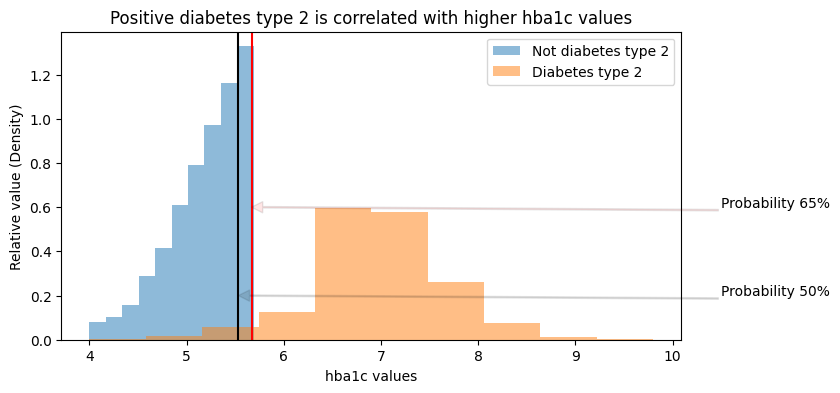

In [46]:
#hba1c visualization for diabetes type 2 by histogram
fig, ax=plt.subplots(figsize=(8, 4))
df_diabetic_stage_type2_no.groupby('diabetes_stage')['hba1c'].plot(kind='hist', ax=ax, legend=True, alpha=0.5, density=True);
ax.set_title('Positive diabetes type 2 is correlated with higher hba1c values');
ax.set_xlabel('hba1c values');
ax.set_ylabel('Relative value (Density)')
ax.legend(['Not diabetes type 2', 'Diabetes type 2'])
ax.axvline(p_50_value, color='black');
ax.axvline(p_65_value, color='red');

ax.annotate(text='Probability 50%',
          xy=(p_50_value, 0.2),
          xytext=(10.5, 0.2),
          arrowprops=dict(facecolor='black', alpha=0.1, width=1, headwidth=8, headlength=8));

ax.annotate(text='Probability 65%',
          xy=(p_65_value, 0.6),
          xytext=(10.5, 0.6),
          arrowprops=dict(facecolor='red', alpha=0.1, width=1, headwidth=8, headlength=8));

plt.show()

The value of glucose_postprandial by probability of diabetics type 2 of 50% = 122.98
The value of glucose_postprandial by probability of diabetics type 2 of 85% = 141.12


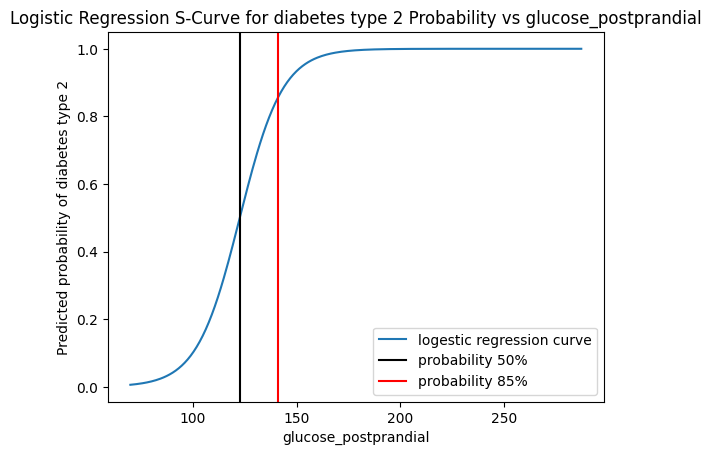

In [47]:
#logistic regression with glucose_postprandial by diabetes type 2
value_range, predicted_glucose_postprandial = logistic_prediction(df_diabetic_stage_type2_no, feature='glucose_postprandial', target='diabetes_stage')

fig, ax = plt.subplots()

ax.plot(value_range, predicted_glucose_postprandial);
ax.set_xlabel("glucose_postprandial");
ax.set_ylabel("Predicted probability of diabetes type 2");
ax.set_title('Logistic Regression S-Curve for diabetes type 2 Probability vs glucose_postprandial')
p_50_index = predicted_glucose_postprandial[predicted_glucose_postprandial>=0.5].index[0]
p_50_value = value_range[p_50_index]
ax.axvline(p_50_value, color='black');
print('The value of glucose_postprandial by probability of diabetics type 2 of 50% =', p_50_value.round(2))
p_85_index = predicted_glucose_postprandial[predicted_glucose_postprandial>=0.85].index[0]
p_85_value = value_range[p_85_index]
ax.axvline(p_85_value, color='red');
print('The value of glucose_postprandial by probability of diabetics type 2 of 85% =', p_85_value.round(2))
plt.legend(['logestic regression curve', 'probability 50%', 'probability 85%']);

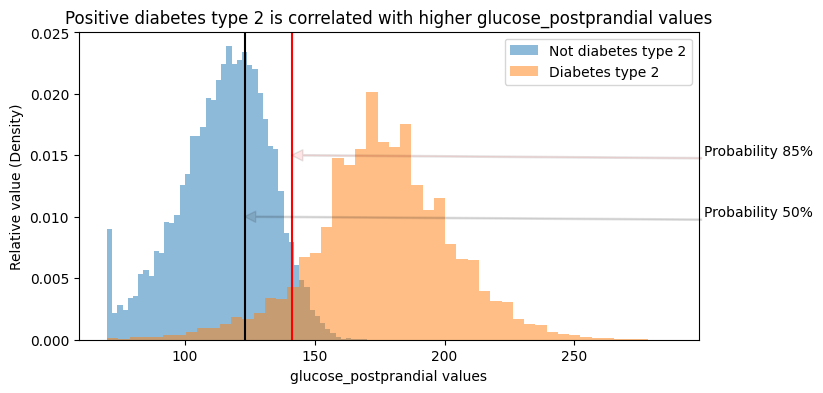

In [48]:
#glucose_postprandial visualization for diabetes type 2 by histogram
fig, ax=plt.subplots(figsize=(8, 4))
df_diabetic_stage_type2_no.groupby('diabetes_stage')['glucose_postprandial'].plot(kind='hist', ax=ax, bins=50, legend=True, alpha=0.5, density=True);
ax.set_title('Positive diabetes type 2 is correlated with higher glucose_postprandial values');
ax.set_xlabel('glucose_postprandial values');
ax.set_ylabel('Relative value (Density)')
ax.legend(['Not diabetes type 2', 'Diabetes type 2'])
ax.axvline(p_50_value, color='black');
ax.axvline(p_85_value, color='red');

ax.annotate(text='Probability 50%',
          xy=(p_50_value, 0.010),
          xytext=(300, 0.010),
          arrowprops=dict(facecolor='black', alpha=0.1, width=1, headwidth=8, headlength=8));

ax.annotate(text='Probability 85%',
          xy=(p_85_value, 0.015),
          xytext=(300, 0.015),
          arrowprops=dict(facecolor='red', alpha=0.1, width=1, headwidth=8, headlength=8));

plt.show()

The value of glucose_fasting by probability of diabetics type 2 of 50% = 93.71
The value of glucose_fasting by probability of diabetics type 2 of 77% = 98.58


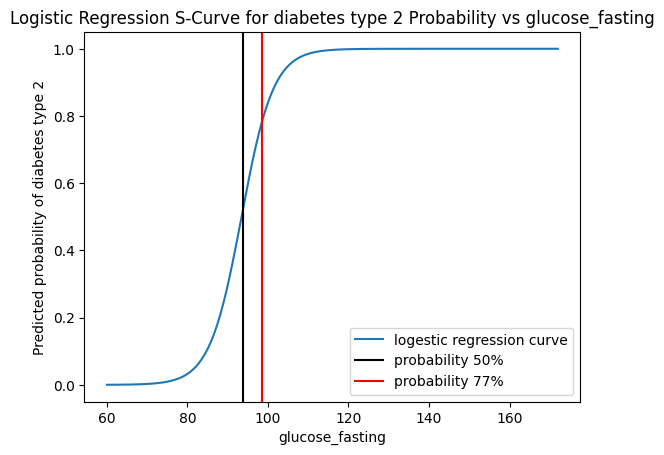

In [49]:
#logistic regression with glucose_fasting by diabetes type 2
value_range, predicted_glucose_fasting = logistic_prediction(df_diabetic_stage_type2_no, feature='glucose_fasting', target='diabetes_stage')

fig, ax = plt.subplots()

ax.plot(value_range, predicted_glucose_fasting);
ax.set_xlabel("glucose_fasting");
ax.set_ylabel("Predicted probability of diabetes type 2");
ax.set_title('Logistic Regression S-Curve for diabetes type 2 Probability vs glucose_fasting')
p_50_index = predicted_glucose_fasting[predicted_glucose_fasting>=0.5].index[0]
p_50_value = value_range[p_50_index]
ax.axvline(p_50_value, color='black');
print('The value of glucose_fasting by probability of diabetics type 2 of 50% =', p_50_value.round(2))
p_77_index = predicted_glucose_fasting[predicted_glucose_fasting>=0.77].index[0]
p_77_value = value_range[p_77_index]
ax.axvline(p_77_value, color='red');
print('The value of glucose_fasting by probability of diabetics type 2 of 77% =', p_77_value.round(2))
plt.legend(['logestic regression curve', 'probability 50%', 'probability 77%']);

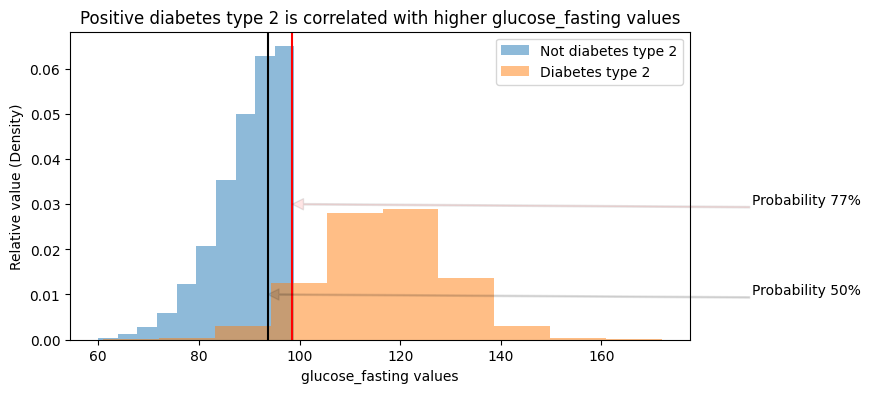

In [50]:
#glucose_postprandial visualization for diabetes type 2 by histogram
fig, ax=plt.subplots(figsize=(8, 4))
df_diabetic_stage_type2_no.groupby('diabetes_stage')['glucose_fasting'].plot(kind='hist', ax=ax, legend=True, alpha=0.5, density=True);
ax.set_title('Positive diabetes type 2 is correlated with higher glucose_fasting values');
ax.set_xlabel('glucose_fasting values');
ax.set_ylabel('Relative value (Density)')
ax.legend(['Not diabetes type 2', 'Diabetes type 2'])
ax.axvline(p_50_value, color='black');
ax.axvline(p_77_value, color='red');

ax.annotate(text='Probability 50%',
          xy=(p_50_value, 0.010),
          xytext=(190, 0.010),
          arrowprops=dict(facecolor='black', alpha=0.1, width=1, headwidth=8, headlength=8));

ax.annotate(text='Probability 77%',
          xy=(p_77_value, 0.03),
          xytext=(190, 0.03),
          arrowprops=dict(facecolor='red', alpha=0.1, width=1, headwidth=8, headlength=8));

plt.show()

The value of diabetes_risk_score by probability of diabetes type 2 of 50% = 12.19
The value of diabetes_risk_score by probability of diabetes type 2 of 65% = 16.94
The value of diabetes_risk_score by probability of diabetes type 2 of 85% = 25.78


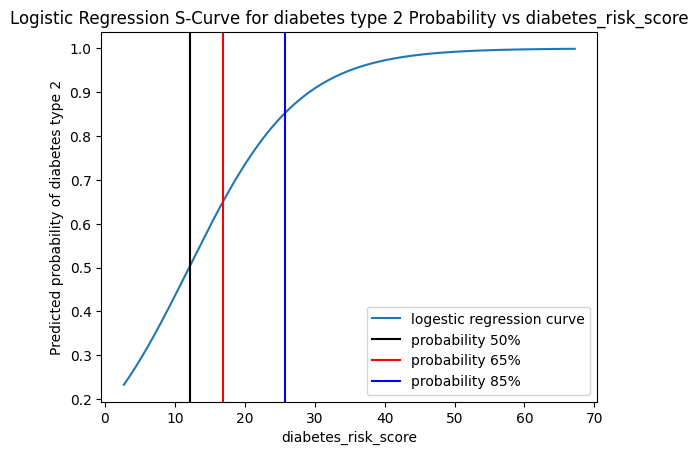

In [51]:
#Logestic regression with diabetes_risk_score by diabetes type 2
value_range, predicted_diabetes_risk_score = logistic_prediction(df_diabetic_stage_type2_no, feature='diabetes_risk_score', target='diabetes_stage')
fig, ax = plt.subplots()

ax.plot(value_range, predicted_diabetes_risk_score);
ax.set_xlabel("diabetes_risk_score");
ax.set_ylabel("Predicted probability of diabetes type 2");
ax.set_title('Logistic Regression S-Curve for diabetes type 2 Probability vs diabetes_risk_score')
p_50_index = predicted_diabetes_risk_score[predicted_diabetes_risk_score>=0.5].index[0]
p_50_value = value_range[p_50_index]
ax.axvline(p_50_value, color='black')
print('The value of diabetes_risk_score by probability of diabetes type 2 of 50% =', p_50_value.round(2))

p_65_index = predicted_diabetes_risk_score[predicted_diabetes_risk_score>=0.65].index[0]
p_65_value = value_range[p_65_index]
ax.axvline(p_65_value, color='red')
print('The value of diabetes_risk_score by probability of diabetes type 2 of 65% =', p_65_value.round(2))

p_85_index = predicted_diabetes_risk_score[predicted_diabetes_risk_score>=0.85].index[0]
p_85_value = value_range[p_85_index]
ax.axvline(p_85_value, color='blue')
print('The value of diabetes_risk_score by probability of diabetes type 2 of 85% =', p_85_value.round(2))

plt.legend(['logestic regression curve', 'probability 50%', 'probability 65%', 'probability 85%']);

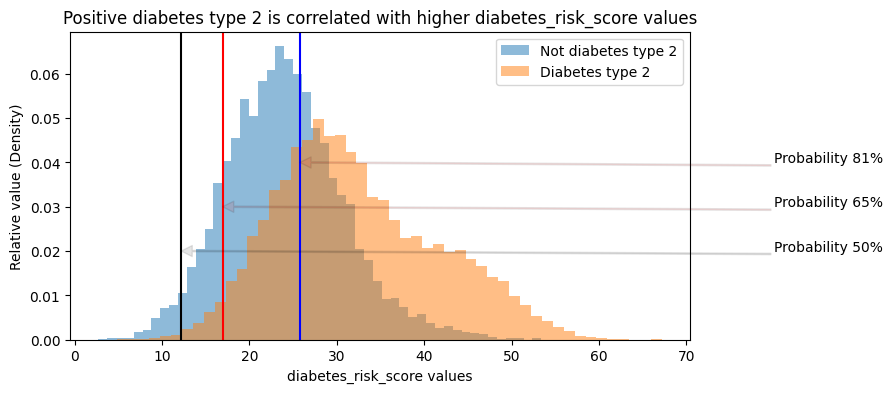

In [52]:
#diabetes_risk_score visualization for diabetes type 2 by histogram
fig, ax=plt.subplots(figsize=(8, 4))
df_diabetic_stage_type2_no.groupby('diabetes_stage')['diabetes_risk_score'].plot(kind='hist', ax=ax, bins=50, legend=True, alpha=0.5, density=True);
ax.set_title('Positive diabetes type 2 is correlated with higher diabetes_risk_score values');
ax.set_xlabel('diabetes_risk_score values');
ax.set_ylabel('Relative value (Density)')
ax.legend(['Not diabetes type 2', 'Diabetes type 2'])
ax.axvline(p_50_value, color='black');
ax.axvline(p_65_value, color='red');
ax.axvline(p_85_value, color='blue');

ax.annotate(text='Probability 50%',
          xy=(p_50_value, 0.02),
          xytext=(80, 0.02),
          arrowprops=dict(facecolor='black', alpha=0.1, width=1, headwidth=8, headlength=8));

ax.annotate(text='Probability 65%',
          xy=(p_65_value, 0.03),
          xytext=(80, 0.03),
          arrowprops=dict(facecolor='red', alpha=0.1, width=1, headwidth=8, headlength=8));

ax.annotate(text='Probability 81%',
          xy=(p_85_value, 0.04),
          xytext=(80, 0.04),
          arrowprops=dict(facecolor='red', alpha=0.1, width=1, headwidth=8, headlength=8));


plt.show()